In [1]:
import warnings
warnings.filterwarnings("ignore")
import os
import time
import re
import pandas as pd 
import numpy as np
import yellowbrick
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.font_manager import FontProperties
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn import metrics, preprocessing
from sklearn.svm import SVC
from sklearn.metrics import average_precision_score, precision_score, recall_score, f1_score, confusion_matrix, accuracy_score, classification_report, roc_curve, auc, roc_auc_score, silhouette_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from scipy.cluster.hierarchy import linkage, dendrogram, cut_tree
from sklearn import decomposition
import scipy.stats as stats
from scipy.linalg import eigh
from math import factorial as f
from pylab import rcParams
rcParams['figure.figsize'] = 10, 15
%matplotlib inline

***
***

# <u>PART A</u>
 ***

## QUESTION 1

<br>

### ***SOLUTION (1 A.)***

In [2]:
car_name = pd.read_csv("C:/Users/pri96/OneDrive/Documents/AI and ML PGP/Module 5 - Unsupervised Learning (Week 17 to Week 19)/Project/Car name.csv")
car_name.head()

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


### ***SOLUTION (1 B.)***

In [3]:
car_attributes = pd.read_json("C:/Users/pri96/OneDrive/Documents/AI and ML PGP/Module 5 - Unsupervised Learning (Week 17 to Week 19)/Project/Car-Attributes.json")
car_attributes.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


### ***SOLUTION (1 C.)***

> Let's merge both these dataframes, car_name and car_attributes, based on their index values, i.e., we'll use index values of both dataframes as the key for merging them

In [4]:
car = pd.merge(car_name, car_attributes, left_index = True, right_index = True)

In [5]:
car.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [6]:
print("There are", car.shape[0], "rows and", car.shape[1], "columns in the dataframe")

There are 398 rows and 9 columns in the dataframe


### ***SOLUTION (1 D.)***

In [7]:
car.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
car_name,398,305,ford pinto,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mpg,398.0,NaN,NaN,NaN,23.514573,7.815984,9.0,17.5,23.0,29.0,46.6
cyl,398.0,NaN,NaN,NaN,5.454774,1.701004,3.0,4.0,4.0,8.0,8.0
disp,398.0,NaN,NaN,NaN,193.425879,104.269838,68.0,104.25,148.5,262.0,455.0
hp,398.0,94.0,150.0,22.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wt,398.0,NaN,NaN,NaN,2970.424623,846.841774,1613.0,2223.75,2803.5,3608.0,5140.0
acc,398.0,NaN,NaN,NaN,15.56809,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,NaN,NaN,NaN,76.01005,3.697627,70.0,73.0,76.0,79.0,82.0
origin,398.0,NaN,NaN,NaN,1.572864,0.802055,1.0,1.0,1.0,2.0,3.0


In [8]:
car.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


Above table shows the 5 Point Summary of **car** dataframe which covers car attributes from the 1970s to early 1980s. It details variations in mileage, launch year, horsepower, weight, and acceleration. The distribution of cylinders and origins shows a diverse range of car types and manufacturing locations, providing valuable insights for analyzing trends and characteristics of the automotive industry in that time period.
<br> Based on the provided 5 point summary, we can infer below pointers:
 1. **Number of Instances and Attributes:**
     * The dataframe contains 398 records of automobile data
     * There are 8 attributes out of which 3 are multivalued discrete - cylinders (cyl), model year (yr), origin (origin) and 5 continuous - displacement (disp), horsepower (hp), weight (wt), miles per gallon (mpg), acceleration (acc)
     <br><br>
 2. **Numerical Attributes Analysis:**
     * The no. of ***cylinders (cyl)*** in cars range from 3 to 8, with 4-cylinder engines being the most prevalent among the cars
     * The ***car-maker (origin)*** takes values only 1,2 and 3, with 1 being the most frequent origin code from where cars are manufactured
     * Both ***disp and wt*** seem to have a right skewed distribution with (Q3 - median) being greater than (median - Q1), and their means surpassing their medians
     * ***acc and yr*** appear to have symmetric disrtibution where mean and median are equal and there is minimal variation
     * Mean for ***mpg*** is equal to median so the distribution might be normal. We can validate this in later parts by having EDA
     * Observation on ***hp*** shows that although it is expected to be a numerical value attribute, there are potentially some missing/unexpected values which contribute it to be an 'object' type feature, hindering further statistical analysis. There might be a need of further checks on this column
     <br><br>
 3. **Overall Observations:** 
     * The dataset covers a diverse range of automotive attributes crucial for understanding performance and efficiency during the 1970s and early 1980s for various car models
     * Inclusion of model year and origin might help in examining trends over time
     * Weight and acceleration also can help in providing insight son handling and speed characteristics of different automobiles

***

## QUESTION 2

<br>

### ***SOLUTION (2 A.)***

In [9]:
print("Feature-wise percentage of missing values present in the dataframe:")
for column in car.select_dtypes(['float64', 'int64']).columns:
    missing_values = car[column].isnull().sum()
    total_values = len(car[column])
    percentage = (missing_values/total_values) * 100
    print(f"{column} - {percentage}%")

Feature-wise percentage of missing values present in the dataframe:
mpg - 0.0%
cyl - 0.0%
disp - 0.0%
wt - 0.0%
acc - 0.0%
yr - 0.0%
origin - 0.0%


In [10]:
null_percentage = (car.isnull().sum() / len(car)) * 100
print("Feature-wise percentage of Null values:\n")
print(null_percentage)

Feature-wise percentage of Null values:

car_name    0.0
mpg         0.0
cyl         0.0
disp        0.0
hp          0.0
wt          0.0
acc         0.0
yr          0.0
origin      0.0
dtype: float64


There are no null values in the dataframe. All columns have 398 records which is the total number of rows in the dataframe. We do not require any imputations.

### ***SOLUTION (2 B.)***

In [11]:
car[car.drop(columns = 'car_name', axis = 1).duplicated()]

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin


> We do not see any duplicate rows in the dataframe so we do not need any imputation.
> However, we do see that car_name doesn't have any impact on the efficiency of the vehicle. So, we can drop the 'car_name' column from our dataframe

In [12]:
car = car.drop(['car_name'], axis = 1)
car.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


### ***SOLUTION (2 C.)***

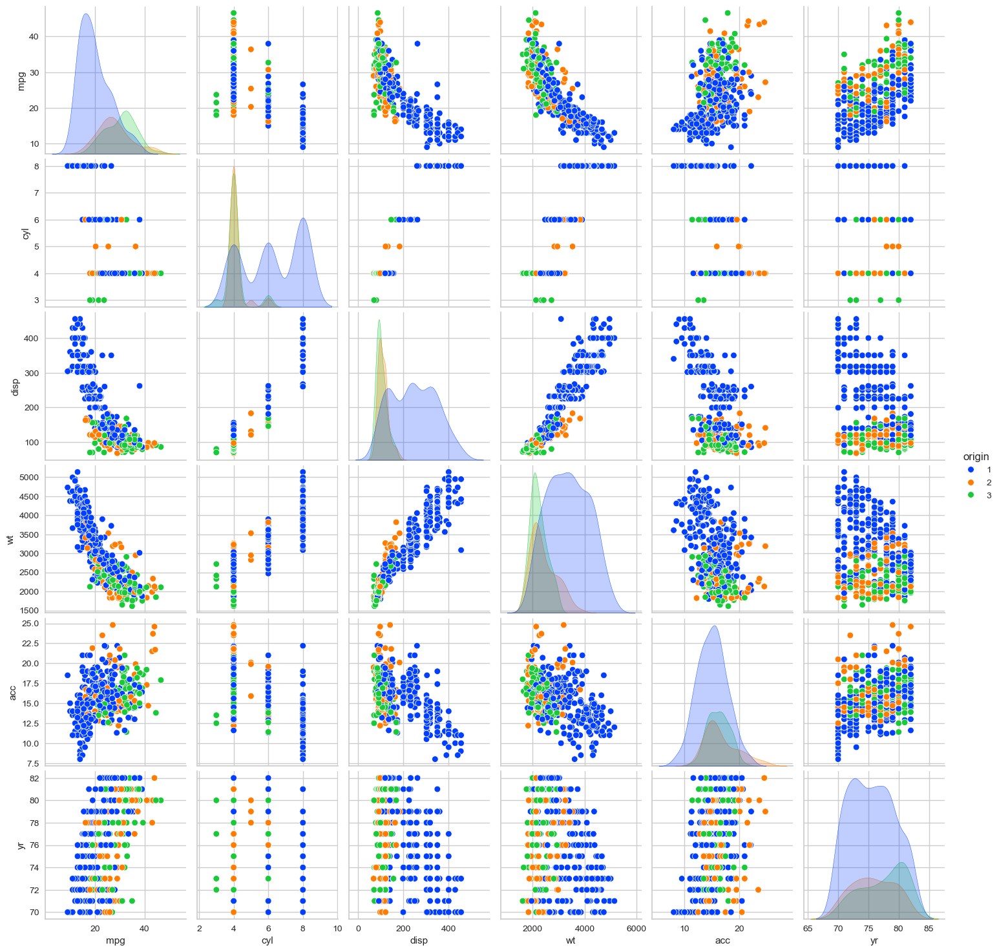

In [13]:
# PairPlot for all features
sns.pairplot(car, hue = 'origin', palette = 'bright')
plt.show() 

Based on the above pair plot, we can see below points:

 * There is a strong negative correlation between miles per gallon (mpg) and weight (wt). This seems to be valid as heavier cars tend to have lower fuel efficiency

 * Similarly, there's a negative correlation between mpg and engine displacement (disp), which might state that cars with larger engines tend to be less fuel efficient

 * There is a positive correlation between weight and engine displacement which means that heavier cars typically have larger engines

 * Acceleration seems less strongly correlated with other features like weight and displacement compared to mpg. This might suggest that factors other than weight and engine size influence acceleration

 * Cars with different numbers of cylinders show distinct clusters in the scatter plots. Cars with more cylinders generally have lower mpg

### ***SOLUTION (2 D.)***

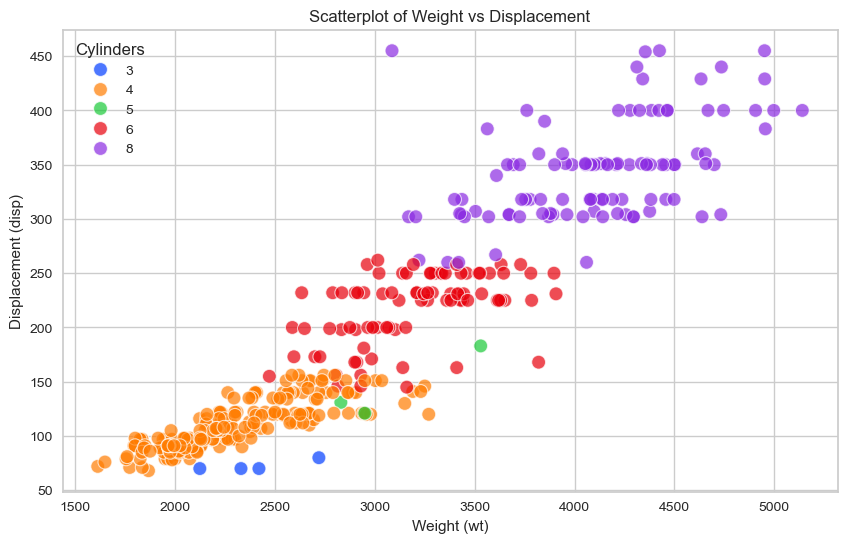

In [14]:
plt.figure(figsize = (10, 6))
scatter_plot = sns.scatterplot(data = car, x = 'wt', y = 'disp', hue = 'cyl', palette = 'bright', s = 100, alpha = 0.7)
plt.title('Scatterplot of Weight vs Displacement')
plt.xlabel('Weight (wt)')
plt.ylabel('Displacement (disp)')
plt.legend(title = 'Cylinders')
plt.grid(True)
plt.show()

### ***SOLUTION (2 E.)***

Based on the above scatter plot, we can see that:
 1. There is a clear positive correlation between the weight of a car and it's displacement, which says that as the weight of the car increase, the engine displacement also increases along
 <br><br>
 2. The distribution with different cylinders says:
     * Cars with 3 cylinders (blue) are rare and generally have low displacement and weight
     * Cars with 4 cylinders (orange) are clustered towards the lower end of both weight and displacement, indicating they are generally lighter and have smaller engines
     * Cars with 5 cylinders (green) are sparse and are too much scattered. They fall in the middle range of weight and displacement
     * Cars with 6 cylinders (red) are in the mid to upper range of weight and displacement, showing moderate engine size and weight
     * Cars with 8 cylinders (purple) are concentrated at the higher end of the spectrum for both weight and displacement, indicating they are heavier with larger engines. We also see outliers for these types of cars
  <br><br>
 3. The cluster distribution of weight and displacement for different numbers of cylinders in cars suggests that cylinder count plays a significant role in influencing weight and displacement
 <br><br>
 4. There are a few outliers particularly among the 8 cylinder cars. This can show that there are some cars which have a higher displacement relative to their weight. These might represent high-performance vehicles with large engines but not excessively heavy

### ***SOLUTION (2 F.)***

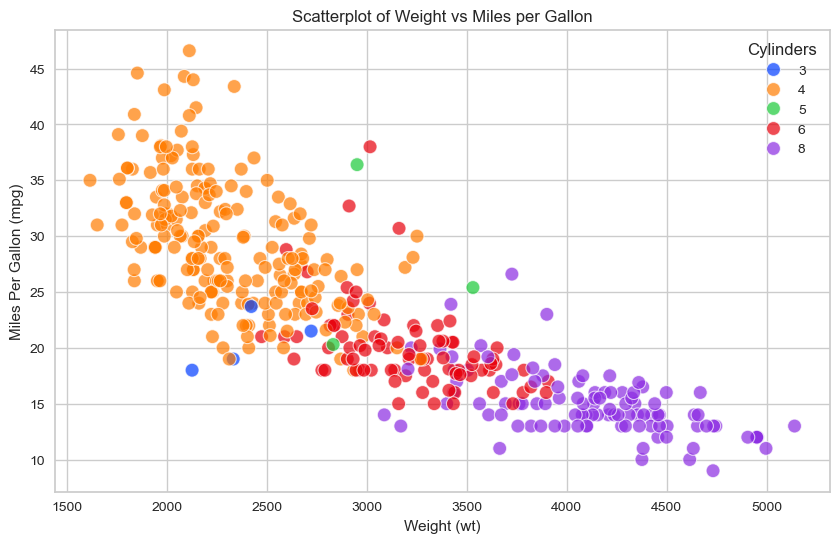

In [15]:
plt.figure(figsize = (10, 6))
scatter_plot = sns.scatterplot(data = car, x = 'wt', y = 'mpg', hue = 'cyl', palette = 'bright', s = 100, alpha = 0.7)
plt.title('Scatterplot of Weight vs Miles per Gallon')
plt.xlabel('Weight (wt)')
plt.ylabel('Miles Per Gallon (mpg)')
plt.legend(title = 'Cylinders')
plt.grid(True)
plt.show()

### ***SOLUTION (2 G.)***

Based on the above scatter plot, we can see that:
 1. There is a strong negative correlation between the weight of a car and it's efficiency (mpg), which says that as the weight of the car increase, its fuel efficiency decreases
 <br><br>
 2. The distribution with different cylinders says:
     * Cars with 3 cylinders (blue) are very few and have relatively have high mpg with low weight
     * Cars with 4 cylinders (orange) generally have the highest mpg and are lighter when compared to their later halfs. They form a dense cluster in the lower weight and higher mpg range
     * Cars with 5 cylinders (green) are rare and scattered, with moderate mpg and weight. They are mostly in the mid range, though
     * Cars with 6 cylinders (red) have moderate to low mpg and are heavier compared to 4-cylinder cars
     * Cars with 8 cylinders (purple) are the heaviest and have the lowest mpg, forming a distinct cluster at the higher weight and lower mpg range in the plot
  <br><br>
 3. The distinct clusters based on the number of cylinders are more prominent for 4, 6, and 8 cylinders, indicating that the number of cylinders is a significant factor in both weight and fuel efficiency
 <br>

Overall, we see that heavier cars with more cylinders generaly have lower fuel efficiency with mpg often below 20 whereas lighter cars (mostly with 4 cylinders) acheive higher fuel efficiency with mpg values mostly above 25

### ***SOLUTION (2 H.)***

> To start off, the first thing we see since beginning is that all the columns in ***car*** dataframe are numeric, except horse power ('hp').
> <br> The column is of 'object' type which suggests that there can be some irrelevant values not matching with numeric standards. Let's check them

In [16]:
car['hp'].unique()

array([130, 165, 150, 140, 198, 220, 215, 225, 190, 170, 160, 95, 97, 85,
       88, 46, 87, 90, 113, 200, 210, 193, '?', 100, 105, 175, 153, 180,
       110, 72, 86, 70, 76, 65, 69, 60, 80, 54, 208, 155, 112, 92, 145,
       137, 158, 167, 94, 107, 230, 49, 75, 91, 122, 67, 83, 78, 52, 61,
       93, 148, 129, 96, 71, 98, 115, 53, 81, 79, 120, 152, 102, 108, 68,
       58, 149, 89, 63, 48, 66, 139, 103, 125, 133, 138, 135, 142, 77, 62,
       132, 84, 64, 74, 116, 82], dtype=object)

In [17]:
car[car['hp'] == '?']

,mpg,cyl,disp,hp,wt,acc,yr,origin
32,25.0,4,98.0,?,2046,19.0,71,1
126,21.0,6,200.0,?,2875,17.0,74,1
330,40.9,4,85.0,?,1835,17.3,80,2
336,23.6,4,140.0,?,2905,14.3,80,1
354,34.5,4,100.0,?,2320,15.8,81,2
374,23.0,4,151.0,?,3035,20.5,82,1


> We see that there are 6 records in ***car*** dataframe with an unexpected value (special character - '?') in 'hp' column. Let's plan to impute it with the median of this column. 
<br>Before that, let's convert it to numeric column. This will convert the non numeric special character to 'NaN' values and we'll be able to identify null values

In [18]:
car['hp'] = pd.to_numeric(car['hp'], errors='coerce')
car.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    int64  
 2   disp    398 non-null    float64
 3   hp      392 non-null    float64
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
 6   yr      398 non-null    int64  
 7   origin  398 non-null    int64  
dtypes: float64(4), int64(4)
memory usage: 25.0 KB


> Now, we see that after converting 'hp' column to numeric ('float64') value, there are 6 null values in the column which need to be imputed with median
<br> Another round of check which needs to be covered is to run a check on all other features for any unexpected values (which is highly unlikely).
<br> Let's start with the code

In [19]:
for column in car.columns:
    unique_values = car[column].unique()
    unexpected_values = []
    
    for value in unique_values:
        if pd.isna(value):  # Checking for NaN values
            unexpected_values.append(value)
        elif not pd.api.types.is_numeric_dtype(car[column]) and not isinstance(value, str):
            unexpected_values.append(value)  # Checking for non-string non-numeric values, which is highly unlikely
    
    if unexpected_values:
        print(f"Column '{column}' has unexpected values: {unexpected_values}")

# Checking for unexpected values across all datapoints (rows)
unexpected_rows = car[car.isnull().any(axis = 1)]
if not unexpected_rows.empty:
    print(f"\nAnd those unexpected values across below {len(unexpected_rows)} rows:\n\n{unexpected_rows}")
else:
    print("No unexpected values found across datapoints.")

print("Imputing these with Median - ", car['hp'].median())

Column 'hp' has unexpected values: [nan]

And those unexpected values across below 6 rows:

      mpg  cyl   disp  hp    wt   acc  yr  origin
32   25.0    4   98.0 NaN  2046  19.0  71       1
126  21.0    6  200.0 NaN  2875  17.0  74       1
330  40.9    4   85.0 NaN  1835  17.3  80       2
336  23.6    4  140.0 NaN  2905  14.3  80       1
354  34.5    4  100.0 NaN  2320  15.8  81       2
374  23.0    4  151.0 NaN  3035  20.5  82       1
Imputing these with Median -  93.5


> After running for all features, we see that only 'hp' column has missing values. Let's impute these 6 with the median

In [20]:
car['hp'].replace(np.nan, car['hp'].median(), inplace = True)

# Re-checking for unexpected values across all datapoints (rows)
unexpected_rows = car[car.isnull().any(axis = 1)]
if not unexpected_rows.empty:
    print(f"\nAnd those unexpected values across below {len(unexpected_rows)} rows:\n\n{unexpected_rows}")
else:
    print("No unexpected values found across datapoints.")

No unexpected values found across datapoints.


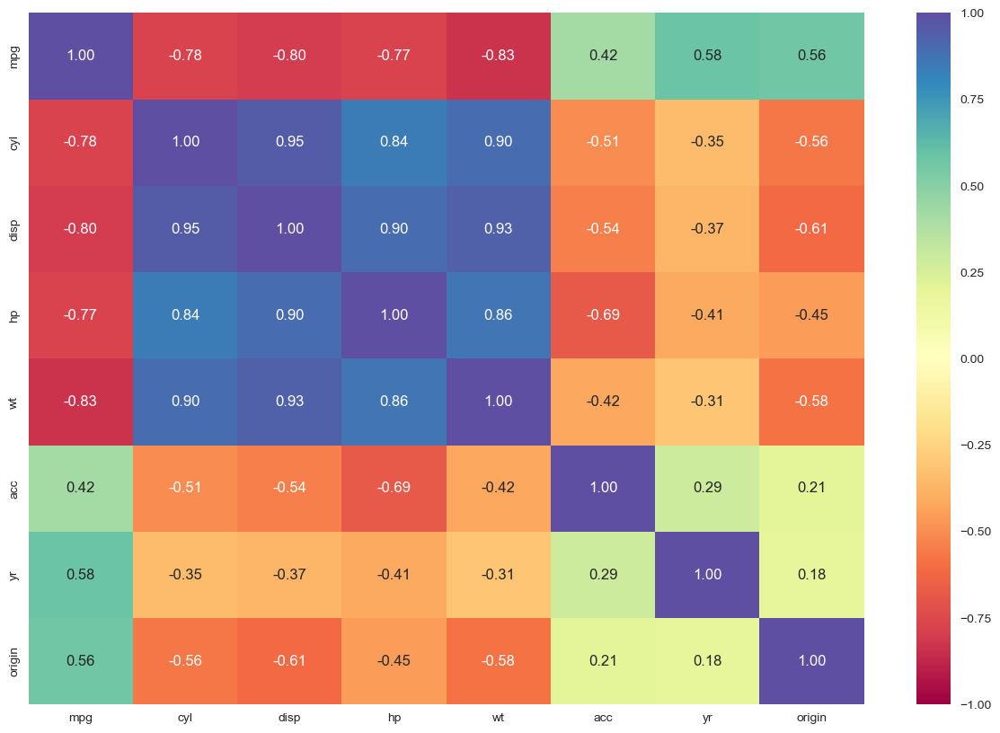

In [21]:
# plot the heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(car.corr(), annot = True, vmin = -1, vmax = 1, fmt = ".2f", cmap = "Spectral")
plt.show()

***

## QUESTION 3

<br>

### ***SOLUTION (3 A.)***

> Let's first scale the dataframe so we have an equal weight to all the features and all contribute equally to the clustering process making it more robust and meaningful

In [22]:
standard_scaler = StandardScaler()

In [23]:
car_scaled = standard_scaler.fit_transform(car)
car_scaled

array([[-0.7064387 ,  1.49819126,  1.0906037 , ..., -1.29549834,
        -1.62742629, -0.71514478],
       [-1.09075062,  1.49819126,  1.5035143 , ..., -1.47703779,
        -1.62742629, -0.71514478],
       [-0.7064387 ,  1.49819126,  1.19623199, ..., -1.65857724,
        -1.62742629, -0.71514478],
       ...,
       [ 1.08701694, -0.85632057, -0.56103873, ..., -1.4407299 ,
         1.62198339, -0.71514478],
       [ 0.57460104, -0.85632057, -0.70507731, ...,  1.10082237,
         1.62198339, -0.71514478],
       [ 0.95891297, -0.85632057, -0.71467988, ...,  1.39128549,
         1.62198339, -0.71514478]])

In [24]:
cluster_range = range(2,11) # To apply KMeans clustering for 2 to 10 clusters
wcss = [] # within-cluster sum of squares
silhouette_scores = [] # to calculate silhouette score for each cluster value

# Apply K-Means clustering for each number of clusters
for k in cluster_range:
    kmeans = KMeans(n_clusters = k, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 42)
    kmeans.fit(car_scaled)
    wcss.append(kmeans.inertia_)
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(car_scaled, labels)
    silhouette_scores.append({'Number of Clusters': k, 'Silhouette Score': format(silhouette_avg, '.5f')})

# Print WCSS values
print("\nWCSS Values:", wcss)

# Print inertia
print("\nFinal Inertia:", format(kmeans.inertia_,'.4f'))

# Print number of iterations
print("\nNumber of Iterations to Converge:", kmeans.n_iter_)

print("\n\nSilhouette Scores for different clusters - ")
silhouette_df = pd.DataFrame(silhouette_scores)
silhouette_df



WCSS Values: [1588.592456791863, 1190.0436525504851, 988.0688340114527, 829.7157874488786, 750.8737927045283, 681.6526858914018, 633.4035136870295, 596.7852585282914, 555.7346945917886]

Final Inertia: 555.7347

Number of Iterations to Converge: 8


Silhouette Scores for different clusters - 


,Number of Clusters,Silhouette Score
0,2,0.41489
1,3,0.32467
2,4,0.31197
3,5,0.33297
4,6,0.33652
5,7,0.29218
6,8,0.29054
7,9,0.26592
8,10,0.27413


>From the silhouette scores, we see that:
>
> * The highest silhouette score is for 2 clusters
> * The score drops for 3 clusters and slightly decreases further for 4 clusters
> * We see a local maximum at 5 and 6 clusters again. Though it is lower than the score for 2 clusters, it's observed to be higher than 3
>
>However, let's check on the Elbow Method as well to see where do we see the WCSS value starting to decrease

### ***SOLUTION (3 B.)***

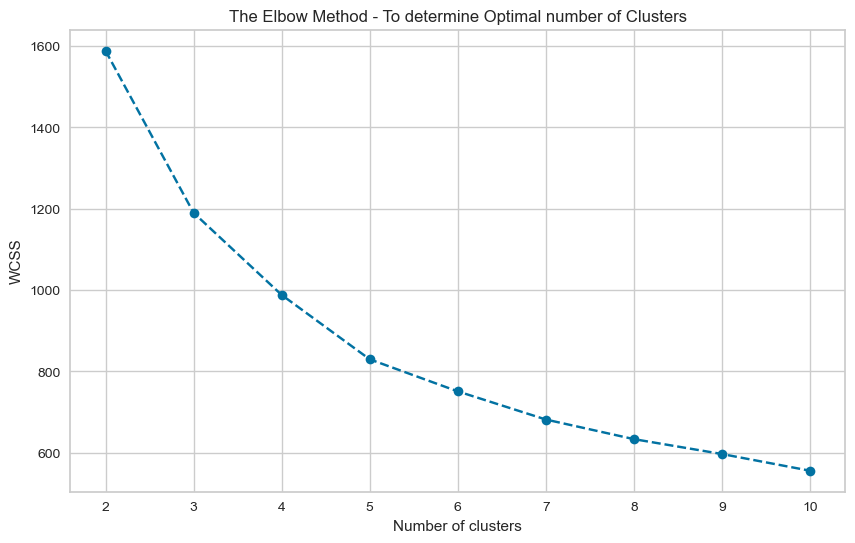

In [25]:
# Plotting the inertia (within-cluster sum of squares) to determine the optimal number of clusters through the Elbow Method
plt.figure(figsize = (10, 6))
plt.plot(cluster_range, wcss, marker = 'o', linestyle = '--', label = 'WCSS')
plt.title('The Elbow Method - To determine Optimal number of Clusters')
plt.xlabel('Number of clusters')
#plt.xticks(cluster_range)
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

>The identification of **Elbow Point** can be done where the Within-Cluster Sum of Squares (WCSS) starts to deminish at a slower rate. We can say it as the optimal number of clusters.
><br> Here in this plot above, we can notice drop in WCSS twice, one at k = 3 and another at k = 4
> * From k = 2 to k = 3, we see a noticeable drop in WCSS value
> * Again from k = 3 to k = 4, a significant drop is observed in WCSS
> 
>Given this analysis, both k = 3 and k = 4 could be considered as potential elbow points. However, <u>**k = 3**</u> might be more appropriate as the true elbow point and we can consider this value as the optimal choice because it marks the point where the reduction rate first starts to diminish more noticeably.

### ***SOLUTION (3 C.)***

Analysis on the possible Elbow points, we have below conclusions:
 * From Elbow method, we see the primary optimal elbow point as 3 clusters as the WCSS drop significantly slows down after this point
 * We calculate the silhouette scores for different numbers of clusters. Higher scores indicate better-defined clusters
     * From Silhouette score, 2 clusters have the highest silhouette score, but considering the Elbow Method and the overall trend, 3 clusters is a reasonable compromise
     * We also see 2 secondary points, 5 and 6 clusters, as they have relatively higher silhouette scores than 3 clusters, making them secondary considerations
 
>We can check on the visualisation of these below:

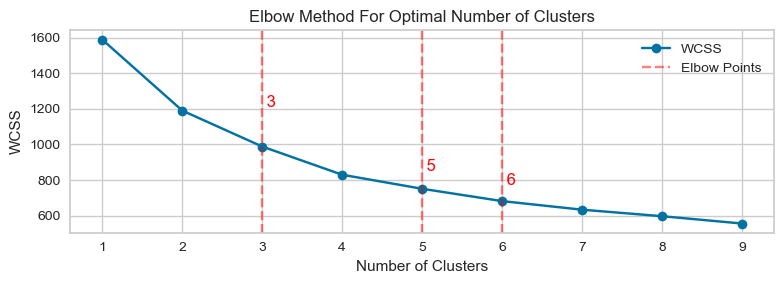

In [26]:
# Calculating wcss again because it's giving error somehow with mismatched datatypes
wcss = []
for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 42)
    kmeans.fit(car_scaled)
    wcss.append(kmeans.inertia_)

# Elbow points based on your previous analysis
elbow_points = [3, 5, 6]

# Create the plot
plt.figure(figsize=(8, 3))
plt.plot(range(1, len(wcss) + 1), wcss, marker = 'o', linestyle = '-')

# Annotate the elbow points
for point in elbow_points:
    plt.axvline(x = point, linestyle = '--', color = 'red', alpha = 0.5)
    plt.text(point, wcss[point - 2] + 20, f' {point}', color = 'red', fontsize = 12)

# Add labels and title
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('Elbow Method For Optimal Number of Clusters')

# Add legend
plt.legend(['WCSS', 'Elbow Points'])

# Adjusting layout and display the plot
plt.tight_layout()
plt.show()

### ***SOLUTION (3 D.)***

>Keeping k = 3 as the optimal number of clusters and training the K-means clustering model again

In [27]:
k = 3 # optimal number of clusters from above analysis
kmeans_optimal = KMeans(n_clusters = k, max_iter = 300, n_init = 15, random_state = 42)
kmeans_optimal

KMeans(n_clusters=3, n_init=15, random_state=42)

In [28]:
kmeans_optimal.fit(car_scaled)

KMeans(n_clusters=3, n_init=15, random_state=42)

In [29]:
wcss = kmeans_optimal.inertia_
labels = kmeans_optimal.labels_

# Print WCSS values
print("\nWCSS Values for k = 3:", wcss)

# Print number of iterations
print("\nNumber of Iterations to Converge for k = 3:", kmeans_optimal.n_iter_)

print("\nSilhouette Score for k = 3 - ", format(silhouette_score(car_scaled, labels), '.5f'))

# Checking on the centroids
cluster_centers = kmeans_optimal.cluster_centers_
cluster_centers


WCSS Values for k = 3: 1190.0436525504851

Number of Iterations to Converge for k = 3: 15

Silhouette Score for k = 3 -  0.32467


array([[-1.12726026,  1.4864187 ,  1.46865697,  1.47338845,  1.36736404,
        -1.03371846, -0.61198576, -0.71514478],
       [-0.23301503, -0.12590632, -0.05634295, -0.24639985,  0.02416321,
         0.43720956,  0.08226919, -0.60579879],
       [ 0.89844152, -0.81610375, -0.86426529, -0.70547867, -0.86985567,
         0.27002569,  0.31010992,  0.95968268]])

In [30]:
# Calculate the centroids for the columns to profile

car_scaled_df = pd.DataFrame(car_scaled, columns = car.columns)
car_scaled_df.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,-0.706439,1.498191,1.090604,0.673118,0.630870,-1.295498,-1.627426,-0.715145
1,-1.090751,1.498191,1.503514,1.589958,0.854333,-1.477038,-1.627426,-0.715145
2,-0.706439,1.498191,1.196232,1.197027,0.550470,-1.658577,-1.627426,-0.715145
3,-0.962647,1.498191,1.061796,1.197027,0.546923,-1.295498,-1.627426,-0.715145
4,-0.834543,1.498191,1.042591,0.935072,0.565841,-1.840117,-1.627426,-0.715145


In [31]:
centroid_df = pd.DataFrame(cluster_centers, columns = car_scaled_df.columns)
centroid_df

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,-1.127260,1.486419,1.468657,1.473388,1.367364,-1.033718,-0.611986,-0.715145
1,-0.233015,-0.125906,-0.056343,-0.246400,0.024163,0.437210,0.082269,-0.605799
2,0.898442,-0.816104,-0.864265,-0.705479,-0.869856,0.270026,0.310110,0.959683


>From above, we see below for each cluster:
>
> * **Cluster 0:** Vehicles with lower mpg, higher values for cylinders, displacement, horsepower, and weight
> * **Cluster 1:** Vehicles with average features closer to the dataset's mean
> * **Cluster 2:** Vehicles with higher mpg, lower values for cylinders, displacement, horsepower, and weight

In [32]:
# Analyzing the centroids to understand feature importance

centroid_means = centroid_df.mean()

print("Mean values of centroids:\n")
print(centroid_means)

Mean values of centroids:

mpg      -0.153945
cyl       0.181470
disp      0.182683
hp        0.173837
wt        0.173891
acc      -0.108828
yr       -0.073202
origin   -0.120420
dtype: float64


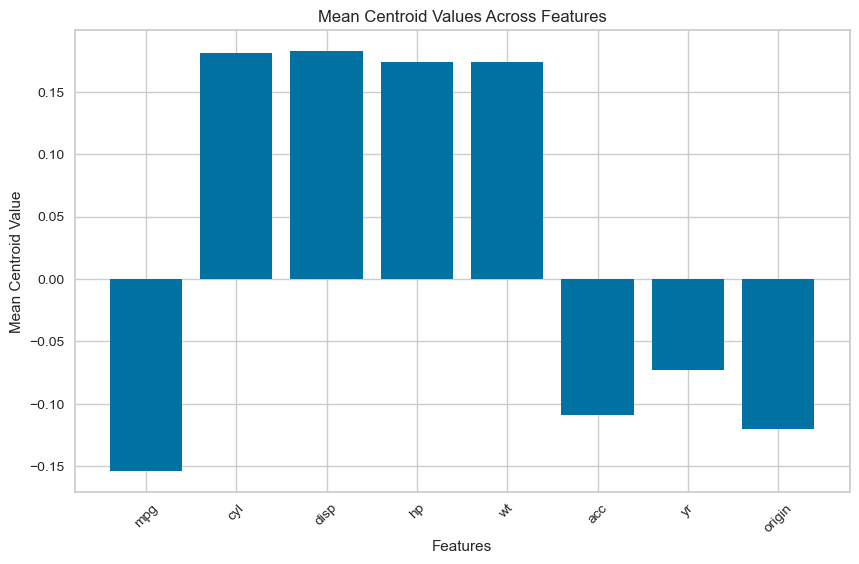

In [33]:
# Plot centroids or feature importance across clusters
plt.figure(figsize = (10, 6))
plt.bar(centroid_df.columns, centroid_means)
plt.xlabel('Features')
plt.ylabel('Mean Centroid Value')
plt.title('Mean Centroid Values Across Features')
plt.xticks(rotation = 45)
plt.show()

>From above, we see below points:
>* **Cylinders (cyl), Displacement (disp), Horsepower (hp), and Weight (wt)** have positive mean centroid values. This indicates that these features are above the overall mean for the dataset within the clusters
>* **Miles per Gallon (mpg), Acceleration (acc), Year (yr), and Origin (origin)** have negative mean centroid values. This suggests that these features are below the overall mean for the dataset within the clusters
>* The features **cyl, disp, hp, and wt** have significantly higher positive centroid values compared to other features, indicating that these features are the most distinguishing characteristics of the clusters
>* On the other hand, **mpg** has the most negative centroid value, highlighting a strong inverse relationship with the positive features, suggesting that vehicles with higher values in **cyl, disp, hp, and wt** have lower fuel efficiency
>* The negative centroid value for **mpg** and positive centroid values for **hp** and **wt** suggest a trade-off between fuel efficiency and vehicle performance. Vehicles with higher horsepower and weight tend to have lower fuel efficiency

### ***SOLUTION (3 E.)***

In [34]:
# Adding the cluster labels as a new feature in the original DataFrame
car['Cluster'] = labels

# Printing random samples from the dataframe
car.sample(5, random_state = 42)

,mpg,cyl,disp,hp,wt,acc,yr,origin,Cluster
198,33.0,4,91.0,53.0,1795,17.4,76,3,2
396,28.0,4,120.0,79.0,2625,18.6,82,1,1
33,19.0,6,232.0,100.0,2634,13.0,71,1,1
208,13.0,8,318.0,150.0,3940,13.2,76,1,0
93,14.0,8,318.0,150.0,4237,14.5,73,1,0


In [35]:
car['Cluster'].value_counts()

Cluster
2    161
1    137
0    100
Name: count, dtype: int64

In [36]:
car['Cluster'].dtype

dtype('int32')

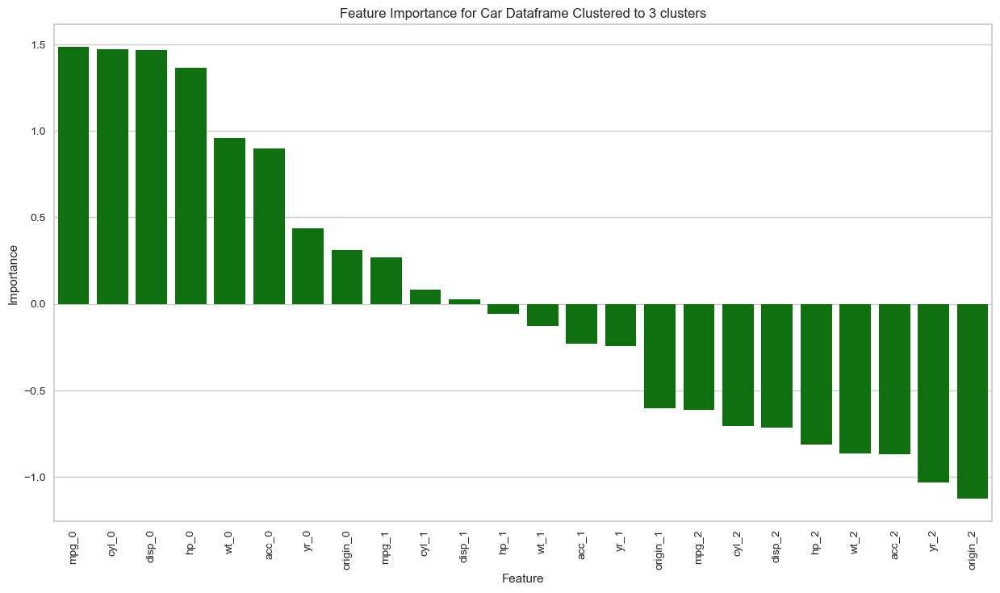

In [37]:
# Identifying important features distinguishing clusters
features_with_clusters = [f'{feat}_{i}' for i in range(len(cluster_centers)) for feat in car_scaled_df.columns]
centroid_values = cluster_centers.flatten()
feature_importance = pd.Series(centroid_values, index = features_with_clusters).sort_values(ascending = False)

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': features_with_clusters, 'Importance': feature_importance}).sort_values(by = 'Importance', ascending = False)

plt.figure(figsize = (15, 8))
sns.barplot(feature_importance_df, color = 'green', x = 'Feature', y = 'Importance')
plt.title(f"Feature Importance for Car Dataframe Clustered to 3 clusters")
plt.xticks(rotation = 90)
plt.show()

>We have now labeled each of our **car** dataframe records cluster-wise for 3 clusters - 0, 1, and 2 and named that column as 'Cluster'.
>
>Based on the feature importance, we can see below points for different clusters:
> 1. **Cluster 0 -**
>    * cyl_0, hp_0, disp_0, wt_0 have a positive importance whereas mpg_0, acc_0, yr_0, origin_0 have a negative one
>    * This suggests that Cluster 0 is characterized by powerful and heavier vehicles however, they have lower miles per gallon and acceleration and are likely to be older
>    * So we can say that, Cluster 0 is characterized by powerful, heavier, and older vehicles with lower fuel efficiency
>    <br><br>
> 2. **Cluster 1 -**
>    * With acc_1, yr_1 having a positive importance we an say that Vehicles in Cluster 1 have higher acceleration and are likely to be newer
>    * However, vehicles in Cluster 1 have lower fuel efficiency, fewer cylinders, lower displacement, lower horsepower indicated by negative importance for mpg_1, cyl_1, disp_1, hp_1
>    * This says that Cluster 1 consists of newer, more agile cars with lower power and fuel efficiency
>        <br><br>
> 3. **Cluster 2 -**
>    * There is a positive importance for mpg_2, yr_2, acc_2 in Cluster 2 suggesting these are characterized by higher fuel efficiency, newer model years, and higher acceleration
>    * A negative importance for cyl_2, disp_2, wt_2, hp_2 suggest that Vehicles in Cluster 2 have fewer cylinders, lower displacement, are lighter, and have lower horsepower
>    * Inference from this is that Cluster 2 includes fuel-efficient, newer, and lighter vehicles with higher acceleration and potentially more environmentally friendly cars

### ***SOLUTION (3 F.)***

>Below is the 3-D plot for MPG, HP and WT as we only have 3 dimensions so 3 features to list in the plot

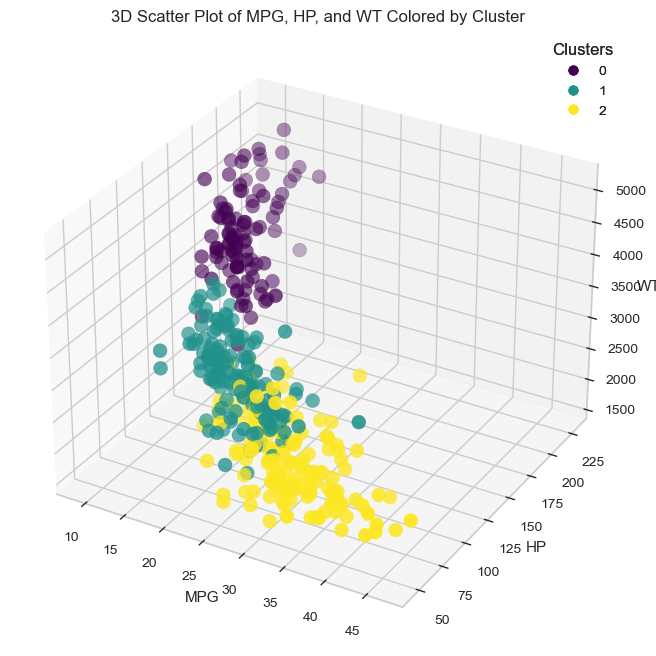

In [38]:
## 3D plots of clusters
fig = plt.figure(figsize = (12, 8))
ax = fig.add_subplot(111, projection = '3d')

# Scatter plot
scatter = ax.scatter(car['mpg'], car['hp'], car['wt'], c = car['Cluster'], cmap = 'viridis', s = 100)

# Adding labels
ax.set_title('3D Scatter Plot of MPG, HP, and WT Colored by Cluster')
ax.set_xlabel('MPG')
ax.set_ylabel('HP')
ax.set_zlabel('WT')

# Adding legend
legend1 = ax.legend(*scatter.legend_elements(), title = "Clusters")
ax.add_artist(legend1)

plt.show()

Based on above 3-D model, we can say below points:
* Cluster 0 (Purple) contains vehicles with lower MPG values, indicating they are less fuel-efficient. These vehicles tend to have higher Horsepower (HP) and higher Weight (WT), suggesting they might be larger, more powerful vehicles
* Cluster 1 (Teal) vehicles have moderate MPG, HP, and WT values, indicating they strike a balance between power and fuel efficiency. These vehicles are likely mid-sized cars
* Cluster 2 (Yellow) is characterized by vehicles with high MPG values, indicating high fuel efficiency. The vehicles in this cluster generally have lower HP and WT values, suggesting they are smaller, lighter, and less powerful cars which are are optimized for economy rather than performance


>Below is the pair plot visualization of all features where clusters are distinguished by colors. Please zoom the plot to view clearly

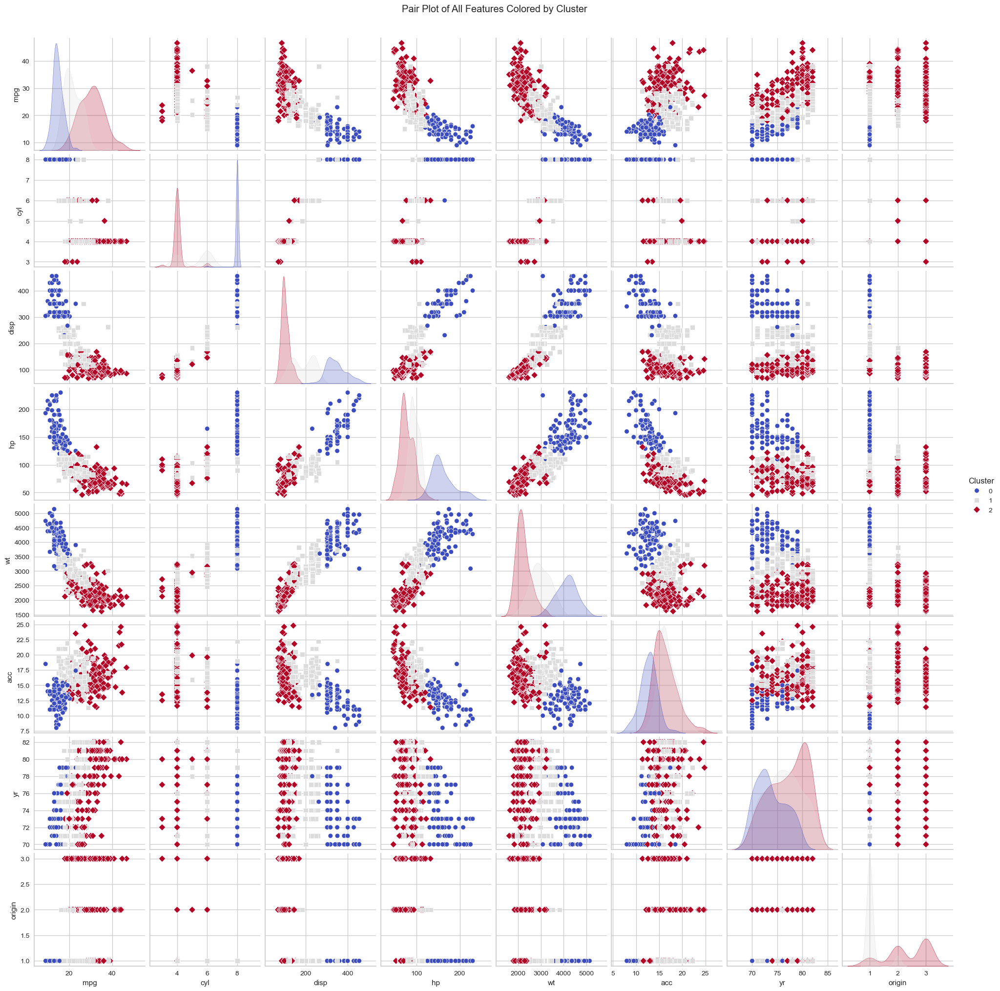

In [39]:
sns.pairplot(car, hue = 'Cluster', palette = 'coolwarm', markers=["o", "s", "D"])
plt.suptitle("Pair Plot of All Features Colored by Cluster", y = 1.02)
plt.show()

The visual plots for datapoints distingushed by Clusters with different colors can be summarized below:

* Cluster 0 (Blue) tends to have higher 'mpg' values and lower 'horsepower' and 'weight' values. This segment is likely to appeal to environmentally conscious consumers and those looking to save on fuel costs
* Cluster 2 (Red) tends to have lower 'mpg' values and higher 'horsepower' and 'weight' values. This segment of cars are more appealing to consumers looking for performance-oriented vehicles
* Cluster 1 (Grey) seems to have a more scattered and overlapping distribution with other clusters in some features.These vehicles may appeal to a broad audience looking for a balance between performance and fuel efficiency


### ***SOLUTION (3 G.)***

In [40]:
# Predicting which cluster a specific set of features belong to based on the datapoints

# Let's create a realistic model and take input from the user themselves

def get_user_input(prompt, data_type):
    while True:
        try:
            user_input = data_type(input(prompt))
            return user_input
        except ValueError:
            print("Invalid input. Please enter a valid value of type:", data_type)
            
print("Input Values for your Car Model\n")
mpg = get_user_input("    Enter MPG value: ", float)
cyl = get_user_input("    Enter Cylinder count: ", int)
disp = get_user_input("    Enter Displacement value: ", float)
hp = get_user_input("    Enter Horsepower value: ", float)
wt = get_user_input("    Enter Weight value: ", float)
acc = get_user_input("    Enter Acceleration value: ", float)
yr = get_user_input("    Enter Year: ", int)
origin = get_user_input("    Enter Origin: ", int)

# creating the new datapoint as an array
new_car_data = pd.DataFrame(np.array([[mpg, cyl, disp, hp, wt, acc, yr, origin]]), columns = car.columns[:-1])

# Since the original data for car dataframe was scaled, let's scale this new one also
new_car_data_scaled = standard_scaler.transform(new_car_data)

print("\n\nEntered Datapoint - ")
new_car_data
# sample data from original dataframe to confirm validation
# 13.0	8	318.0	150.0	3940	13.2	76	1	0

Input Values for your Car Model

    Enter MPG value: 13
    Enter Cylinder count: 8.4
Invalid input. Please enter a valid value of type: <class 'int'>
    Enter Cylinder count: 8
    Enter Displacement value: 318
    Enter Horsepower value: 150
    Enter Weight value: 3940
    Enter Acceleration value: 13.2r
Invalid input. Please enter a valid value of type: <class 'float'>
    Enter Acceleration value: 13.2
    Enter Year: 76
    Enter Origin: 1


Entered Datapoint - 


,mpg,cyl,disp,hp,wt,acc,yr,origin
0,13.0,8.0,318.0,150.0,3940.0,13.2,76.0,1.0


Here we have entered the same values as one of the actual records and the predicted value for this is Cluster 0. Let's see if we get the same result from our prediction also

In [41]:
# Predicting which cluster the new data point belongs to
predicted_cluster = kmeans_optimal.predict(new_car_data_scaled)


if predicted_cluster[0] == 0:
    print(f"The new data point is predicted to belong to Cluster 0. \nThis type of vehicle is less fuel-efficient but might appeal to consumers who prioritize power, capacity, and features over fuel economy")
elif predicted_cluster[0] == 1:
    print(f"The new data point is predicted to belong to Cluster 1. \nThis type of vehicle represents mid-range vehicles, possibly compact cars, or mid-sized sedans and appeals to a broad market seeking a balance between performance and fuel efficiency.")
elif predicted_cluster[0] == 2:
    print(f"The new data point is predicted to belong to Cluster 2. \nThis type of vehicle likely represents more fuel-efficient vehicles, such as compact cars, hybrids, or electric vehicles and appeal to environmentally conscious consumers and those looking to save on fuel costs")


The new data point is predicted to belong to Cluster 0. 
This type of vehicle is less fuel-efficient but might appeal to consumers who prioritize power, capacity, and features over fuel economy


***We got the same result as Cluster 0 and hence validated our model clustering as correct one***

***
***
# <u>PART B</u>
 ***

## QUESTION 1

<br>

### ***SOLUTION (1 A.)***

In [42]:
vehicle = pd.read_csv("C:/Users/pri96/OneDrive/Documents/AI and ML PGP/Module 5 - Unsupervised Learning (Week 17 to Week 19)/Project/vehicle.csv")
vehicle.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [43]:
print("There are", vehicle.shape[0], "rows and", vehicle.shape[1], "columns in the dataframe")

There are 846 rows and 19 columns in the dataframe


### ***SOLUTION (1 B.)***

In [44]:
vehicle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

Based on the above information, we can infer below: 
 * All values are of numerical type, except class. We can use label encoding for this to convert it to numerical type feature however we won't be doing that right now and would see if it's required in future
 * There are no null values for 5 features (class, hollow_ratio, max.length_rectangularity, max.length_aspect_ratio, compactness). rest all features have null values and require imputation. We'll impute them with their respective median values

In [45]:
# Check percentage of missing values in each column
missing_percentages = vehicle.isnull().mean() * 100

# Print missing percentages
print("Percentage of missing values in each column:")
print(missing_percentages)
vehicle.isnull().sum()

Percentage of missing values in each column:
compactness                    0.000000
circularity                    0.591017
distance_circularity           0.472813
radius_ratio                   0.709220
pr.axis_aspect_ratio           0.236407
max.length_aspect_ratio        0.000000
scatter_ratio                  0.118203
elongatedness                  0.118203
pr.axis_rectangularity         0.354610
max.length_rectangularity      0.000000
scaled_variance                0.354610
scaled_variance.1              0.236407
scaled_radius_of_gyration      0.236407
scaled_radius_of_gyration.1    0.472813
skewness_about                 0.709220
skewness_about.1               0.118203
skewness_about.2               0.118203
hollows_ratio                  0.000000
class                          0.000000
dtype: float64


compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [46]:
columns_with_unexpected_values = []
for column in vehicle.columns:
    unique_values = vehicle[column].unique()
    unexpected_values = []
    
    for value in unique_values:
        if pd.isna(value):  # Checking for NaN values
            unexpected_values.append(value)
        elif not pd.api.types.is_numeric_dtype(vehicle[column]) and not isinstance(value, str):
            unexpected_values.append(value)  # Checking for non-string non-numeric values, which is highly unlikely            
    
    if unexpected_values:
        print(f"Column '{column}' has unexpected values: {unexpected_values}")
        columns_with_unexpected_values.append(column)

# Checking for unexpected values across all datapoints (rows)
unexpected_rows = pd.DataFrame(vehicle[vehicle.isnull().any(axis = 1)])
if not unexpected_rows.empty:
    print(f"\nAnd some of those unexpected values across below {len(unexpected_rows)} rows:\n\n")
else:
    print("No unexpected values found across datapoints.")
unexpected_rows.head()

Column 'circularity' has unexpected values: [nan]
Column 'distance_circularity' has unexpected values: [nan]
Column 'radius_ratio' has unexpected values: [nan]
Column 'pr.axis_aspect_ratio' has unexpected values: [nan]
Column 'scatter_ratio' has unexpected values: [nan]
Column 'elongatedness' has unexpected values: [nan]
Column 'pr.axis_rectangularity' has unexpected values: [nan]
Column 'scaled_variance' has unexpected values: [nan]
Column 'scaled_variance.1' has unexpected values: [nan]
Column 'scaled_radius_of_gyration' has unexpected values: [nan]
Column 'scaled_radius_of_gyration.1' has unexpected values: [nan]
Column 'skewness_about' has unexpected values: [nan]
Column 'skewness_about.1' has unexpected values: [nan]
Column 'skewness_about.2' has unexpected values: [nan]

And some of those unexpected values across below 33 rows:




,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
5,107,NaN,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,bus
9,93,44.0,98.0,NaN,62.0,11,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204,car
19,101,56.0,100.0,215.0,NaN,10,208.0,32.0,24.0,169,227.0,651.0,223.0,74.0,6.0,5.0,186.0,193,car
35,100,46.0,NaN,172.0,67.0,9,157.0,43.0,20.0,150,170.0,363.0,184.0,67.0,17.0,7.0,192.0,200,van
66,81,43.0,68.0,125.0,57.0,8,149.0,46.0,19.0,146,169.0,323.0,172.0,NaN,NaN,18.0,179.0,184,bus


In [47]:
# Imputing above instances of missing values with median
for column in columns_with_unexpected_values:
    vehicle[column].fillna(vehicle.groupby('class')[column].transform('median'),inplace = True)

vehicle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  846 non-null    float64
 2   distance_circularity         846 non-null    float64
 3   radius_ratio                 846 non-null    float64
 4   pr.axis_aspect_ratio         846 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                846 non-null    float64
 7   elongatedness                846 non-null    float64
 8   pr.axis_rectangularity       846 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              846 non-null    float64
 11  scaled_variance.1            846 non-null    float64
 12  scaled_radius_of_gyration    846 non-null    float64
 13  scaled_radius_of_gyr

>Now all columns have non null values. Let's check the 5 Point summary for the dataframe

In [48]:
vehicle.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
compactness,846.0,NaN,NaN,NaN,93.678487,8.234474,73.0,87.0,93.0,100.0,119.0
circularity,846.0,NaN,NaN,NaN,44.826241,6.13434,33.0,40.0,44.0,49.0,59.0
distance_circularity,846.0,NaN,NaN,NaN,82.066194,15.754263,40.0,70.0,80.0,98.0,112.0
radius_ratio,846.0,NaN,NaN,NaN,168.916076,33.427561,104.0,141.0,167.25,195.0,333.0
pr.axis_aspect_ratio,846.0,NaN,NaN,NaN,61.680851,7.882557,47.0,57.0,61.0,65.0,138.0
max.length_aspect_ratio,846.0,NaN,NaN,NaN,8.567376,4.601217,2.0,7.0,8.0,10.0,55.0
scatter_ratio,846.0,NaN,NaN,NaN,168.920804,33.199802,112.0,147.0,157.0,198.0,265.0
elongatedness,846.0,NaN,NaN,NaN,40.927896,7.813401,26.0,33.0,43.0,46.0,61.0
pr.axis_rectangularity,846.0,NaN,NaN,NaN,20.579196,2.590879,17.0,19.0,20.0,23.0,29.0
max.length_rectangularity,846.0,NaN,NaN,NaN,147.998818,14.515652,118.0,137.0,146.0,159.0,188.0


 * There are 846 instances with 19 attributes (columns) including both numerical (18) and categorical (1) features
 * SOme attributes like radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, scaled_variance.1, scaled_radius_of_gyration, and skewness_about.1 have relatively high standard deviations compared to their means, suggesting potential outliers or significant variability in the data
 * The class attribute has 3 unique classes (car, van, bus) with car being the most frequent (429 instances). This suggests an imbalance where one class (car) dominates
 * Compactness and circularity have mean and median values almost similar, which signifies that they both are normally distributed and have no skewness/outlier
 * We can have further insights with various EDA

### ***SOLUTION (1 C.)***

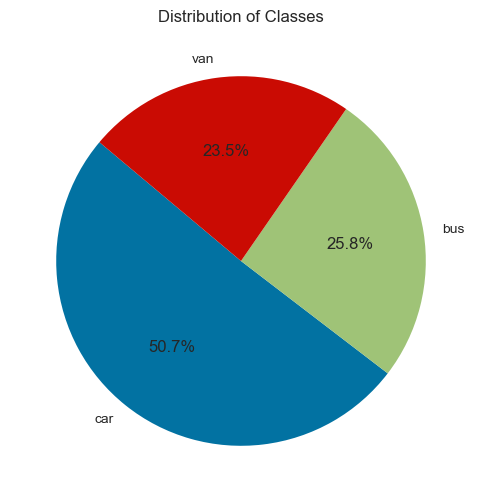

Percentage of values for variable 'class':
class
car    50.709220
bus    25.768322
van    23.522459
Name: count, dtype: float64


In [49]:
# Count the occurrences of each class
class_counts = vehicle['class'].value_counts()

# Plotting a pie chart
plt.figure(figsize = (8, 6))
plt.pie(class_counts, labels = class_counts.index, autopct = '%1.1f%%', startangle = 140)
plt.title('Distribution of Classes')
plt.show()

# Print percentage of values for each class
print("Percentage of values for variable 'class':")
print(class_counts / len(vehicle) * 100)

Based on above pie-chart, we see that:
* Appproximately 50.7% of the vehicles in the dataset are classified as cars. The percetage division of buses and vans are ~25.8% and ~23.5% respectively
* The dataset is slightly imbalanced towards cars, which constitute more than half of the vehicles. Buses and vans make up the remaining portion, with buses being slightly more frequent than vans


We can also say that the models trained on this dataframe may be biased towards predicting 'car' instances more accurately due to their higher representation in the dataset

### ***SOLUTION (1 D.)***

In [50]:
duplicate_rows = vehicle[vehicle.duplicated()]

if not duplicate_rows.empty:
    print(f"Number of duplicate rows: {len(duplicate_rows)}")
    print("Duplicate rows:")
    print(duplicate_rows)
else:
    print("No duplicate rows found.")

No duplicate rows found.


>There are no duplictae rows so no further steps required for impution/correctness 
>
>Before proceeding to next parts, let's have some analysis on the given dataset

#### PAIR PLOT

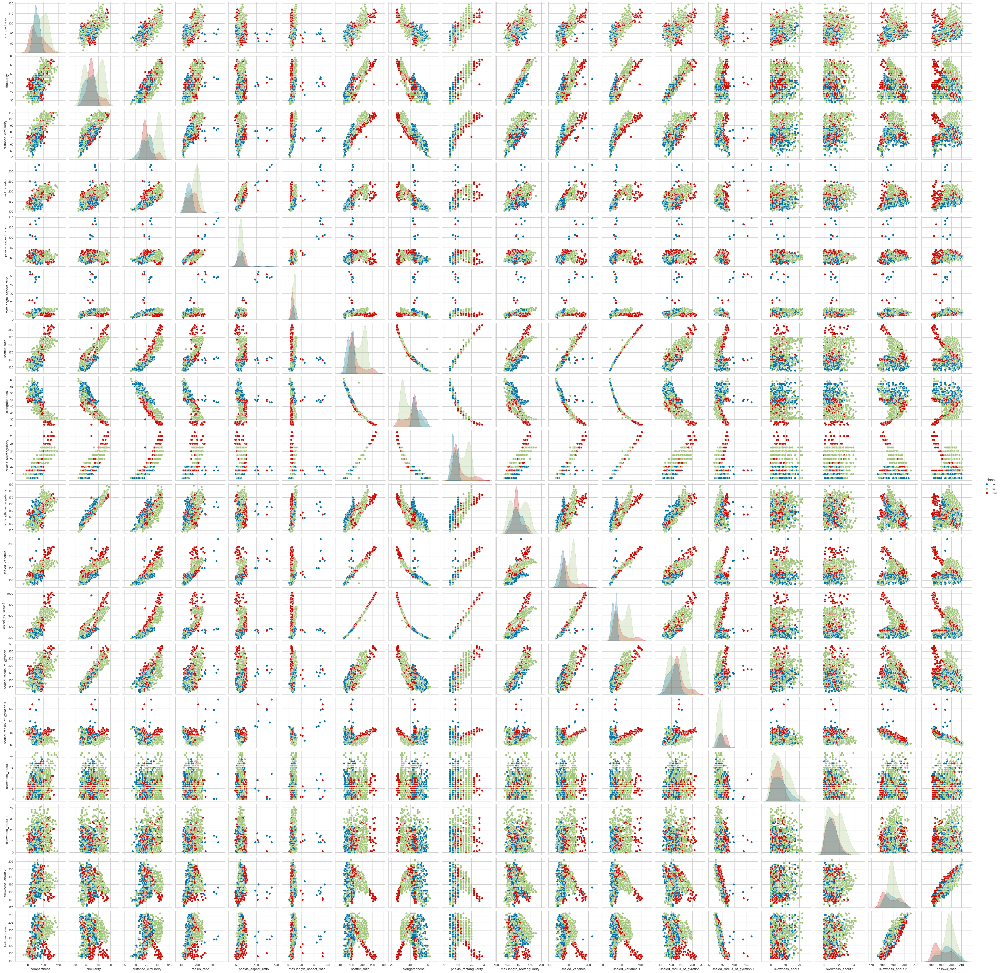

In [51]:
sns.pairplot(vehicle, diag_kind = 'kde', hue = 'class')

The pair plot shows that:
 * 'Compactness' is least spread for vans and maximum spread for cars whereas, it is right-skewed for buses indicating that less number of buses have high compactness
 * 'scaled_radius_of_gyration', 'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1', 'skewness_about.2', 'pr.axis_aspect_ratio', have almost similar distribution for cars, buses and vans
 * max.length_aspect_ratio is almost same for cars and vans however, it is lower for buses. On the other hand,  is has almost same distribution for car, van and buses
 * While 'hollows_ratio' is lower for buses as compared to cars and vans, mean 'elomngatedness' is highest for vans followed by bus and car
 * 'pr.axis_rectangularity' and mean 'scales_variance' both are highest for cars, followed by bus and then vans
 * Many columns have long tails indicating outliers

#### CORRELATION & HEAT MAP

<Axes: >

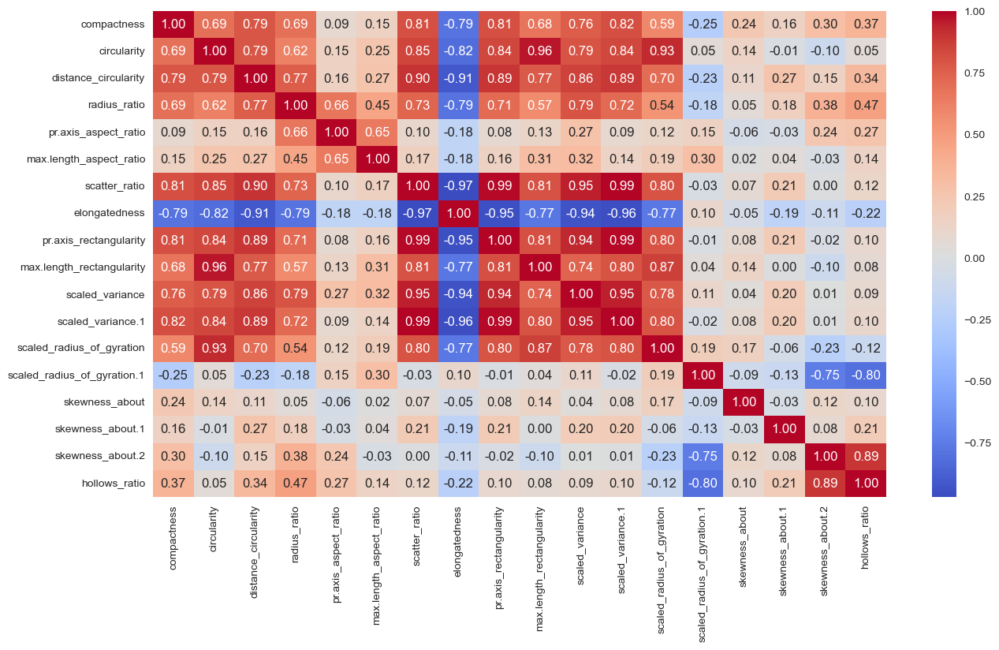

In [52]:
plt.figure(figsize = (15, 8))
sns.heatmap(vehicle.select_dtypes(['float64', 'int64']).corr(), cmap = 'coolwarm', annot = True, fmt = ".2f")


 * There are few variables, such as, 'skewness_about', 'skewness_about.1', 'skewness_about.2'. 'hollows.ratio' which exibhit weak realtionship though almost all attributes
 * Many columns( example - 'circularity' and 'max.length_rectangularity') are highly correlated. Since multiple features are highly correlated with one another we face the risk of multicollinearity. We can use PCA for such features
 * Strongest correlation of 0.99 is found between some features such as 'scatter_ratio' & 'scaled_variance.1' 

#### BOX PLOT

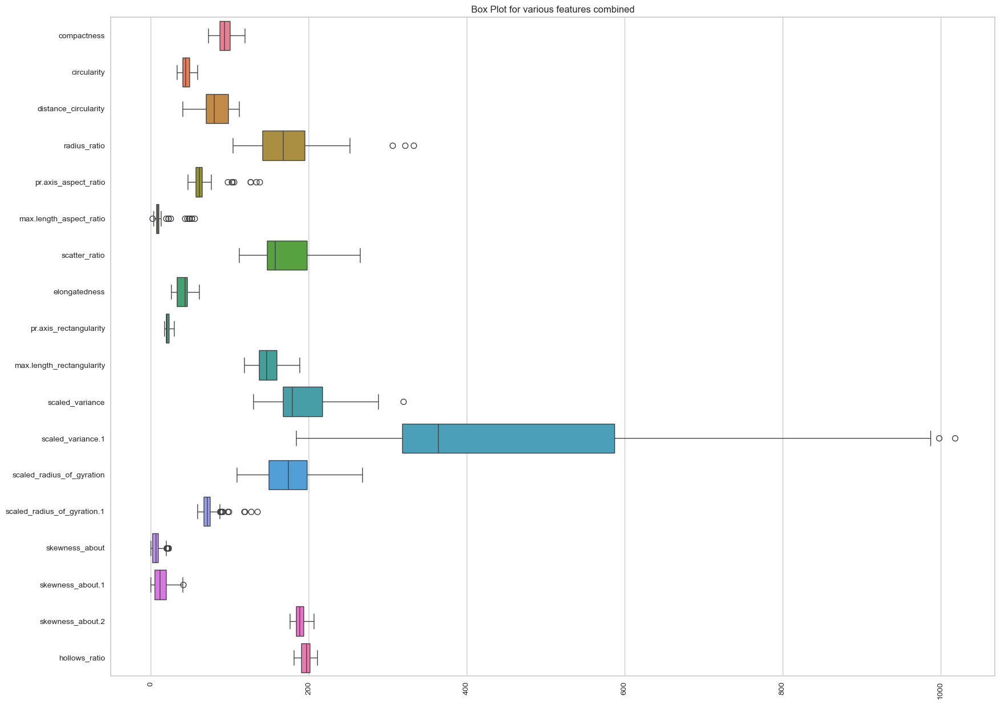

In [53]:
plt.figure(figsize = (20,15))
sns.boxplot(vehicle, orient = 'h')
plt.title(f"Box Plot for various features combined")
plt.xticks(rotation = 90)
plt.show()

We see there are many features where we have outliers such as such as radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, scaled_variance, scaled_variance.1, skewness_about, skewness_about.1.

Let's see if we can treat those outliers so they do not affect our final predictions.

In [54]:
# finding the outliers and replace them by median
outliers = pd.DataFrame()
for col_name in vehicle.columns[:-1]:
    q1 = vehicle[col_name].quantile(0.25)
    q3 = vehicle[col_name].quantile(0.75)
    iqr = q3 - q1
    
    # Defining outlier boundaries
    lower_bound = q1 - 1.5 * iqr
    higher_bound = q3 + 1.5 * iqr
    
    #  Finding rows with outliers
    outlier_rows = vehicle[((vehicle[col_name] < lower_bound) | (vehicle[col_name] > higher_bound))]
    
    # Append to outliers DataFrame
    outliers = pd.concat([outliers, outlier_rows])

outliers = outliers.drop_duplicates()

print("There are", outliers.shape[0], "rows with outliers which contribute to", 
      format(outliers.shape[0]*100/vehicle.shape[0], '.2f'), "% of overall data. Few  records are - ")
outliers.head()

There are 33 rows with outliers which contribute to 3.90 % of overall data. Few  records are - 


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
37,90,48.0,86.0,306.0,126.0,49,153.0,44.0,19.0,156,272.0,346.0,200.0,118.0,0.0,15.0,185.0,194,van
135,89,47.0,83.0,322.0,133.0,48,158.0,43.0,20.0,163,229.0,364.0,176.0,97.0,0.0,14.0,184.0,194,van
388,94,47.0,85.0,333.0,138.0,49,155.0,43.0,19.0,155,320.0,354.0,187.0,135.0,12.0,9.0,188.0,196,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus
100,82,45.0,66.0,252.0,126.0,52,148.0,45.0,19.0,144,237.0,326.0,185.0,119.0,1.0,1.0,181.0,185,bus


**SMALL CORRECTION ON ABOVE OUTPUT** - There are 33 ***unique*** rows with outliers which contribute to 3.90 % of overall data

Since the percentage is less, let's keep these records rather than imputing the outlier values with median or removing them from our list and move on 
<br>

***Please also check the final comparison for more info***

## QUESTION 2
<br>

### ***SOLUTION (2 A.)***

Before proceeding, let's do encoding for 'class' feature all other are numerical but this. It will be easier to have this as target variable while splitting

In [55]:
vehicle['class'].replace(['bus','car','van'],[0,1,2],inplace = True)
vehicle.sample(5, random_state = 42)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
39,81,45.0,68.0,169.0,73.0,6,151.0,44.0,19.0,146,173.0,336.0,186.0,75.0,7.0,0.0,183.0,189,0
250,95,38.0,66.0,126.0,52.0,8,133.0,52.0,18.0,140,158.0,253.0,140.0,78.0,11.0,8.0,184.0,183,2
314,90,42.0,63.0,126.0,55.0,7,152.0,45.0,19.0,142,173.0,336.0,173.0,81.0,0.0,15.0,180.0,184,0
96,89,42.0,80.0,151.0,62.0,6,144.0,46.0,19.0,139,166.0,308.0,170.0,74.0,17.0,13.0,185.0,189,1
198,81,46.0,71.0,130.0,56.0,7,153.0,44.0,19.0,149,172.0,342.0,191.0,81.0,3.0,14.0,180.0,186,0


In [56]:
# Splitting data into X and Y

X = vehicle.drop('class',axis = 1)  # All independent variables (i.e., excluding 'class' as that is target variable)
y = vehicle['class'] # Target variable

In [57]:
print("Shape of X -->", X.shape)
X.head()

Shape of X --> (846, 18)


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183


In [58]:
print("Shape of y -->", y.shape[0])
y.head()

Shape of y --> 846


0    2
1    2
2    1
3    2
4    0
Name: class, dtype: int64

In [59]:
# Optionally, splitting X and Y into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Shapes of the resulting datasets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("Y_train shape:", y_train.shape[0])
print("Y_test shape:", y_test.shape[0])

X_train shape: (676, 18)
X_test shape: (170, 18)
Y_train shape: 676
Y_test shape: 170


### ***SOLUTION (2 B.)***

We'll be using Standard Scaler to standardize the data

In [60]:
# Standardizing the data
standard_scaler = StandardScaler()

# # scaling the training data using the standard scaler and transforming both the training and test data
X_scaled = standard_scaler.fit_transform(X)
X_train_scaled = standard_scaler.fit_transform(X_train)
X_test_scaled = standard_scaler.transform(X_test)

In [61]:
# Converting the scaled data back to DataFrame for better readability
X_scaled_df = pd.DataFrame(X_scaled, columns = X_train.columns)
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns = X_train.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns = X_test.columns)

# Shapes of the resulting datasets to ensure correctness
print("X_tscaled_df shape:", X_scaled_df.shape)
print("X_train_scaled_df shape:", X_train_scaled_df.shape)
print("X_test_scaled_df shape:", X_test_scaled_df.shape)

print("\nScaled Training Set - ")
X_train_scaled_df.head()

X_tscaled_df shape: (846, 18)
X_train_scaled_df shape: (676, 18)
X_test_scaled_df shape: (170, 18)

Scaled Training Set - 


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,-0.443190,0.349416,0.183792,-0.254030,0.248478,0.252818,-0.170925,0.129128,-0.212659,0.818422,-0.362267,-0.279110,0.331818,0.086576,0.523775,-1.435485,-0.644358,-0.124558
1,1.008227,1.155578,1.207426,1.271755,0.248478,0.252818,1.056647,-1.033025,0.972155,0.614846,0.834855,1.036794,0.362736,-0.949266,-1.295087,0.689615,0.629285,0.954946
2,1.371081,1.316811,1.655266,1.066361,0.128499,0.650734,1.639743,-1.291281,1.762031,1.361293,1.223111,1.593299,0.826504,-0.172385,1.736349,2.479174,-0.007536,0.954946
3,2.580596,1.155578,1.143449,0.978335,0.008519,0.252818,1.486297,-1.291281,1.367093,1.157716,1.320175,1.506345,1.228436,-0.042905,1.534253,-0.988096,-0.166742,0.145318
4,1.854887,1.639276,0.887541,0.626231,-0.591378,-0.543014,2.222840,-1.678665,2.156969,1.497011,2.549652,2.433855,2.094136,1.640339,0.321679,-0.428859,-0.803564,-1.608876


## QUESTION 3
<br>


In [62]:
# Create Confusion Matrix
def plot_confusion_matrix(conf_matrix_train, conf_matrix_test):
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    sns.heatmap(conf_matrix_train, annot = True, fmt = 'd', cmap = 'Blues', ax = axes[0])
    axes[0].set_title('Confusion Matrix for Training Set')
    axes[0].set_xlabel('Predicted Labels')
    axes[0].set_ylabel('Actual Labels')
    axes[0].set_xticks(ticks = [0.5, 1.5, 2.5], labels = ['bus','car', 'van'])
    axes[0].set_yticks(ticks = [0.5, 1.5, 2.5], labels = ['bus','car', 'van'])

    sns.heatmap(conf_matrix_test, annot = True, fmt = 'd', cmap = 'Blues', ax = axes[1])
    axes[1].set_title('Confusion Matrix for Testing Set')
    axes[1].set_xlabel('Predicted Labels')
    axes[1].set_ylabel('Actual Labels')
    axes[1].set_xticks(ticks = [0.5, 1.5, 2.5], labels = ['bus','car', 'van'])
    axes[1].set_yticks(ticks = [0.5, 1.5, 2.5], labels = ['bus','car', 'van'])
    
    plt.tight_layout()
    plt.show()
    
    print("Confusion Matrix for Final Training Set:\n", conf_matrix_train)
    print("Confusion Matrix for Final Testing Set:\n", conf_matrix_test)

In [63]:
# Create Evaluation Metrics for checking performance of the model
def evaluation_metrics(y_train, y_train_pred, y_test, y_test_pred, conf_matrix_train, conf_matrix_test):
    
    # Compute evaluation metrics for training set
    accuracy_train = accuracy_score(y_train, y_train_pred)
    precision_train = precision_score(y_train, y_train_pred, average='macro')
    recall_train = recall_score(y_train, y_train_pred, average='macro')
    f1_train = f1_score(y_train, y_train_pred, average='macro')
    
    # Compute evaluation metrics for testing set
    accuracy_test = accuracy_score(y_test, y_test_pred)
    precision_test = precision_score(y_test, y_test_pred, average='macro')
    recall_test = recall_score(y_test, y_test_pred, average='macro')
    f1_test = f1_score(y_test, y_test_pred, average='macro')
    
    # Print evaluation metrics on train set
    print("Training Set:")
    print("    Accuracy:", format(accuracy_train, '.3f'))
    print("    Recall:", format(recall_train, '.3f'))
    print("    Precision:", format(precision_train, '.3f'))
    print("    F1 Score:", format(f1_train, '.3f'))
    
    # Print evaluation metrics on test set
    print("Testing Set:")
    print("    Accuracy:", format(accuracy_test, '.3f'))
    print("    Recall:", format(recall_test, '.3f'))
    print("    Precision:", format(precision_test, '.3f'))
    print("    F1 Score:", format(f1_test, '.3f'))
    
    print("\nClassification Report for Training Set:")
    print(classification_report(y_train, y_train_pred))
    
    print("\nClassification Report for Testing Set:")
    print(classification_report(y_test, y_test_pred))
    
    # Plot confusion matrix
    print("\n Confusion Matrix:")
    plot_confusion_matrix(conf_matrix_train, conf_matrix_test)

### ***SOLUTION (3 A.)***

In [64]:
# Train a base SVM model
svm_model = SVC(random_state = 42)
svm_model

SVC(random_state=42)

In [65]:
svm_model.fit(X_train_scaled, y_train)

SVC(random_state=42)

In [66]:
# Predicting the train and test set

y_test_pred = svm_model.predict(X_test_scaled)
y_train_pred = svm_model.predict(X_train_scaled)

print("Train Set Accuracy:", format(accuracy_score(y_train, y_train_pred), '.5f'))
print("Test Set Accuracy:", format(accuracy_score(y_test, y_test_pred), '.5f'))

Train Set Accuracy: 0.97781
Test Set Accuracy: 0.96471


The model has shown strong performance on both the training and test sets, indicating that the SVM classifier is working well with the current data.
<br>
Let's take a further look at the evaluation metrics

### ***SOLUTION (3 B.)***

Training Set:
    Accuracy: 0.978
    Recall: 0.979
    Precision: 0.971
    F1 Score: 0.975
Testing Set:
    Accuracy: 0.965
    Recall: 0.962
    Precision: 0.961
    F1 Score: 0.961

Classification Report for Training Set:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       166
           1       1.00      0.97      0.99       351
           2       0.93      0.99      0.96       159

    accuracy                           0.98       676
   macro avg       0.97      0.98      0.97       676
weighted avg       0.98      0.98      0.98       676


Classification Report for Testing Set:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97        52
           1       0.97      0.97      0.97        78
           2       0.93      0.95      0.94        40

    accuracy                           0.96       170
   macro avg       0.96      0.96      0.96       170
weighted avg       0.97    

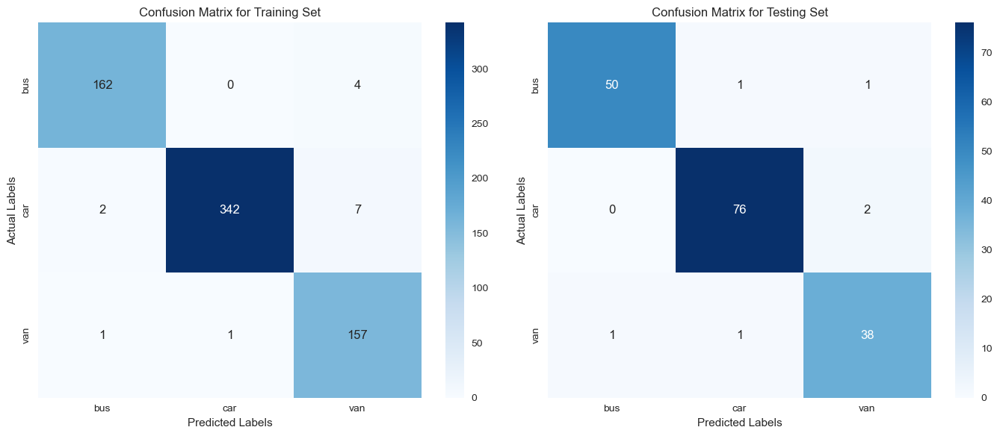

Confusion Matrix for Final Training Set:
 [[162   0   4]
 [  2 342   7]
 [  1   1 157]]
Confusion Matrix for Final Testing Set:
 [[50  1  1]
 [ 0 76  2]
 [ 1  1 38]]


In [67]:
# Evaulating the performance of the model on train and test set

conf_matrix_train = confusion_matrix(y_train, y_train_pred)
conf_matrix_test = confusion_matrix(y_test, y_test_pred)

evaluation_metrics(y_train, y_train_pred, y_test, y_test_pred, conf_matrix_train, conf_matrix_test)

Based on the above Training set Classification and Evaluation Metrics, we can see that:
 * The trained SVM model achieves an accuracy of 97.8%, indicating that it correctly predicts the class for 97.8% of the instances in the training set
 * Precision is high across all classes: 98% for  'bus', 100% for 'car', and 93% for 'van'. This means that all positive predictions made by the model are indeed correct most of the times
 * Recall and F1-Score are also high for all 3 classes with both 98% for 'bus', 97% and 99% for 'car' and 99% and 96% for 'van' which says that the true positives are correctly identified by the model out of all actual positives
 * The model performs exceptionally well across all evaluated metrics, indicating correstness in distinguishing between different classes
 * Class 'car', with the highest number of instances (351), shows a strong performance in precision (100%) and recall (97%)

In [68]:
# Creating a table for final comparison of performance
final_comparison = pd.DataFrame({'Model': ['Base Classification SVM Model'],
                                 'Accuracy(Training Set)': format(accuracy_score(y_train, y_train_pred), '.4f'), 
                                 'Accuracy(Testing Set)': format(accuracy_score(y_test, y_test_pred), '.4f')})
final_comparison.style.set_properties(**{'text-align': 'center'}).set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center')]
}])

,Model,Accuracy(Training Set),Accuracy(Testing Set)
0,Base Classification SVM Model,0.9778,0.9647


### ***SOLUTION (3 C.)***

In [69]:
# Initialize PCA with 10 components
pca = PCA(n_components = 10, random_state = 42)
pca

PCA(n_components=10, random_state=42)

In [70]:
X_scaled_pca = pca.fit_transform(X_scaled)
X_scaled_pca_df = pd.DataFrame(data = X_scaled_pca, columns=[f'PC{i+1}' for i in range(10)])
X_scaled_pca_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,0.332879,-0.218140,1.001637,0.179057,0.076843,-0.753967,-0.902262,-0.378040,-0.869626,0.086012
1,-1.592694,-0.421925,-0.368609,0.232003,0.694728,-0.521978,0.375718,0.247503,0.146706,-0.097514
2,3.766520,0.194842,0.088327,1.201539,0.735230,0.702624,-0.030635,0.484975,-0.307837,-0.472301
3,-1.739121,-2.830152,0.109963,0.377442,-0.362594,-0.487600,0.469005,-0.024940,-0.029085,0.458695
4,0.554789,4.758143,11.702781,0.127962,3.258638,-0.216775,2.668966,-0.449257,2.080059,-0.353789


In [71]:
train_components = pca.fit_transform(X_train_scaled)
train_components_df = pd.DataFrame(data = train_components, columns=[f'PC{i+1}' for i in range(10)])

train_components_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-0.110513,0.859804,0.235515,1.591566,-0.430930,-0.564894,-0.104220,0.495340,-0.273076,0.290108
1,3.301477,-1.236994,0.051426,-1.208303,-0.929064,-0.497399,0.041812,-0.072972,-0.257940,-0.054264
2,4.863695,-0.675251,-0.414380,-0.698250,2.592910,-0.479460,-0.196134,-0.020072,-0.109403,0.389099
3,4.550590,0.218622,-0.607456,1.634557,0.437398,0.844733,0.981790,-0.353124,-0.589432,-0.233298
4,5.553824,2.994292,-1.469964,0.131012,-0.042943,1.543470,0.433511,-0.745188,0.583316,-0.049594


In [72]:
test_components = pca.transform(X_test_scaled)
test_components_df = pd.DataFrame(data = test_components, columns=[f'PC{i+1}' for i in range(10)])

test_components_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-1.577571,1.489773,0.888802,1.163088,-0.875105,0.500964,-1.467997,0.588959,-0.386660,0.288425
1,-3.421192,1.406123,-0.779170,0.844824,0.973908,0.395229,1.143318,-0.454851,-0.533109,-0.093077
2,-2.313533,2.428395,-0.646175,-1.035570,-0.370347,-0.126882,0.189353,-0.661788,-0.012591,-0.248955
3,-1.845035,0.608363,-0.413841,1.229706,1.726480,0.575354,-0.612596,0.539373,-0.486457,-0.165806
4,-1.847392,2.604335,-0.587007,-0.402655,-0.178670,-0.714021,-0.755661,0.075134,0.462111,-0.042849


Above, we have applied PCA (Principal Component Analysis) on our training and test data. With this, we have reduced the dimensionality of our data while retaining the maximum amount of variance possible

<br> We have also transformed our dataset along with it's training and test set and we can also use them now for further analysis, modeling, or visualization.

### ***SOLUTION (3 D.)***

To visualize the cumulative variance explained by the number of principal components as suggested in the question, we can plot a line graph that shows how the cumulative variance increases with each additional component.

Let's see the implementation of the same:

In [73]:
# Calculating the explained variance ratios
explained_variance_ratio = pca.explained_variance_ratio_
explained_variance_ratio

array([0.52220259, 0.16551691, 0.1110342 , 0.06742256, 0.04989689,
       0.02719243, 0.01866177, 0.01239035, 0.00859992, 0.00503776])

In [74]:
cumulative_explained_variance = explained_variance_ratio.cumsum()
cumulative_explained_variance

array([0.52220259, 0.68771951, 0.79875371, 0.86617626, 0.91607315,
       0.94326558, 0.96192735, 0.9743177 , 0.98291762, 0.98795538])

In [76]:
# Printing explained variance ratios for each principal component
print("Explained Variance Ratios:")
for i, evr in enumerate(explained_variance_ratio):
    print(f"    PC{i+1}: {evr:.5f}")

Explained Variance Ratios:
    PC1: 0.52220
    PC2: 0.16552
    PC3: 0.11103
    PC4: 0.06742
    PC5: 0.04990
    PC6: 0.02719
    PC7: 0.01866
    PC8: 0.01239
    PC9: 0.00860
    PC10: 0.00504


In [77]:
# Printing explained variance ratios for each principal component
print("Cumulative Variance:")
for i, cumulative_var in enumerate(cumulative_explained_variance, 1):
    print(f"    Component {i}: {cumulative_var:.5f}")

Cumulative Variance:
    Component 1: 0.52220
    Component 2: 0.68772
    Component 3: 0.79875
    Component 4: 0.86618
    Component 5: 0.91607
    Component 6: 0.94327
    Component 7: 0.96193
    Component 8: 0.97432
    Component 9: 0.98292
    Component 10: 0.98796


In [78]:
overall_variance_explained = np.sum(explained_variance_ratio)
print(f"Overall Variance Explained by 10 PCA components: {overall_variance_explained:.4f}")

Overall Variance Explained by 10 PCA components: 0.9880


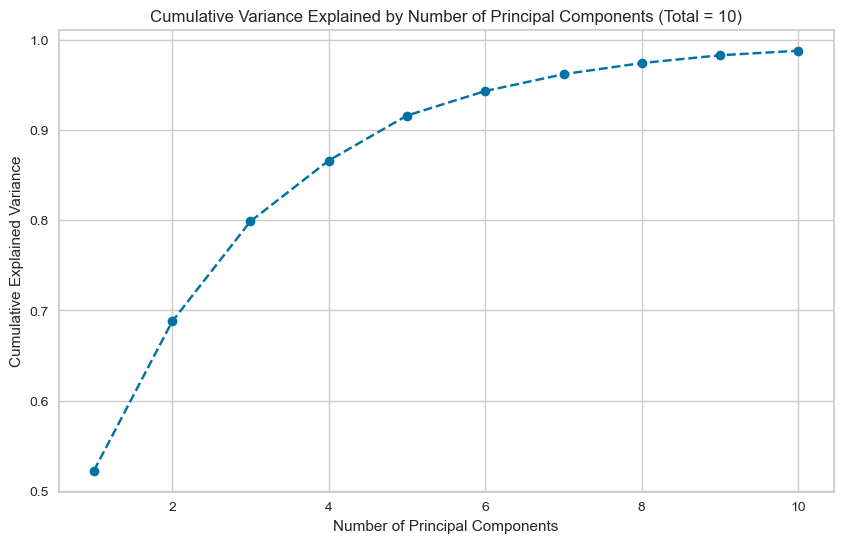

In [79]:
# Visualization of above
plt.figure(figsize = (10, 6))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker = 'o',
         linestyle = '--', color = 'b')
plt.title('Cumulative Variance Explained by Number of Principal Components (Total = 10)')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

 * We see that there is a steep initial rise in the cumulative variance
 * There is an **elbow point** appearing to be at 3 or 4 primcipal components after which we see there is a slow increase in the explained variance values
 * The curve also starts to flatten after 6 components and reaches almost to the value of 1 which explianes that the 10th component was able to capture almost all the variance of our dataset

### ***SOLUTION (3 E.)***

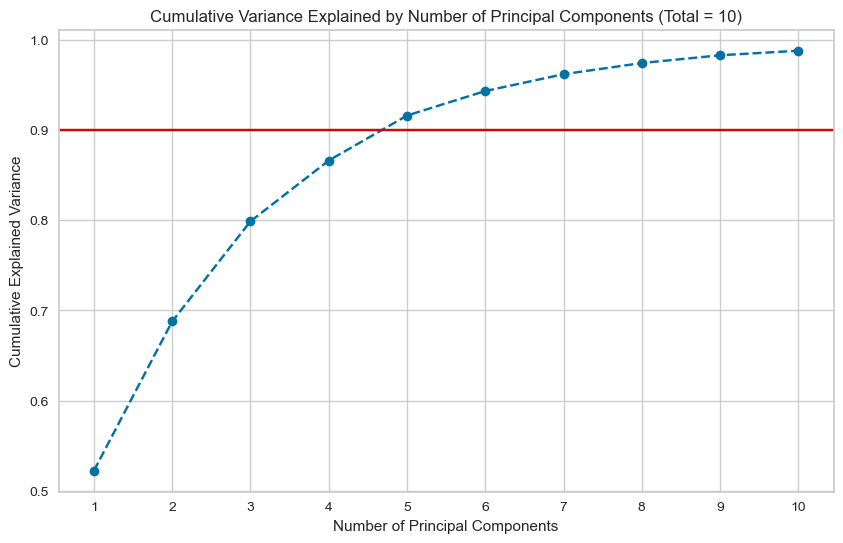

In [80]:
# Adding a horizontal line to highlight the threshold of 90%
plt.figure(figsize = (10, 6))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker = 'o',
         linestyle = '--', color = 'b')
plt.axhline(y = 0.90, color = 'r', linestyle = '-')
plt.title('Cumulative Variance Explained by Number of Principal Components (Total = 10)')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.xticks(range(1, len(cumulative_explained_variance) + 1))
plt.grid(True)
plt.show()

We've added a red horizontal line at 90% of the total variance. In this case, it’s reached just before including the 5th principal component. So, we can say that around 5 principal components are needed to capture approximately 90% of the total variance in the dataset and should give a good balance in our data

### ***SOLUTION (3 F.)***

To apply PCA on minimum number of components with 90% or above variance, let's find the number of compinents with such variance

In [81]:
# Determine the number of components for 90% variance
num_components = np.argmax(cumulative_explained_variance >= 0.90) + 1
print(" The suitable number of minimum compoenents to explain 90% or more variance is -", num_components)

 The suitable number of minimum compoenents to explain 90% or more variance is - 5


In [82]:
pca_90 = PCA(n_components = num_components, random_state = 42)
pca_90

PCA(n_components=5, random_state=42)

In [83]:
X_scaled_pca_90 = pca_90.fit_transform(X_scaled)
X_scaled_pca_90_df = pd.DataFrame(data = X_scaled_pca_90, columns=[f'PC_90_{i+1}' for i in range(num_components)])

print("There are", X_scaled_pca_90_df.shape[0], "rows and", X_scaled_pca_90_df.shape[1], "columns in the below dataframe")
X_scaled_pca_90_df.head()

There are 846 rows and 5 columns in the below dataframe


,PC_90_1,PC_90_2,PC_90_3,PC_90_4,PC_90_5
0,0.332879,-0.218140,1.001637,0.179057,0.076843
1,-1.592694,-0.421925,-0.368609,0.232003,0.694728
2,3.766520,0.194842,0.088327,1.201539,0.735230
3,-1.739121,-2.830152,0.109963,0.377442,-0.362594
4,0.554789,4.758143,11.702781,0.127962,3.258638


In [84]:
train_components_90 = pca_90.fit_transform(X_train_scaled)
train_components_90_df = pd.DataFrame(data = train_components_90, columns=[f'PC_90_{i+1}' for i in range(num_components)])

print("There are", train_components_90_df.shape[0], "rows and", train_components_90_df.shape[1], "columns in the below dataframe")
train_components_90_df.head()

There are 676 rows and 5 columns in the below dataframe


,PC_90_1,PC_90_2,PC_90_3,PC_90_4,PC_90_5
0,-0.110513,0.859804,0.235515,1.591566,-0.430930
1,3.301477,-1.236994,0.051426,-1.208303,-0.929064
2,4.863695,-0.675251,-0.414380,-0.698250,2.592910
3,4.550590,0.218622,-0.607456,1.634557,0.437398
4,5.553824,2.994292,-1.469964,0.131012,-0.042943


In [85]:
test_components_90 = pca_90.transform(X_test_scaled)
test_components_90_df = pd.DataFrame(data = test_components_90, columns=[f'PC_90_{i+1}' for i in range(num_components)])

print("There are", test_components_90_df.shape[0], "rows and", test_components_90_df.shape[1], "columns in the below dataframe")
test_components_90_df.head()

There are 170 rows and 5 columns in the below dataframe


,PC_90_1,PC_90_2,PC_90_3,PC_90_4,PC_90_5
0,-1.577571,1.489773,0.888802,1.163088,-0.875105
1,-3.421192,1.406123,-0.779170,0.844824,0.973908
2,-2.313533,2.428395,-0.646175,-1.035570,-0.370347
3,-1.845035,0.608363,-0.413841,1.229706,1.726480
4,-1.847392,2.604335,-0.587007,-0.402655,-0.178670


Now that we have applied PCA on minimum nummber of componenets, which is 5, let's try to plot it similar to above

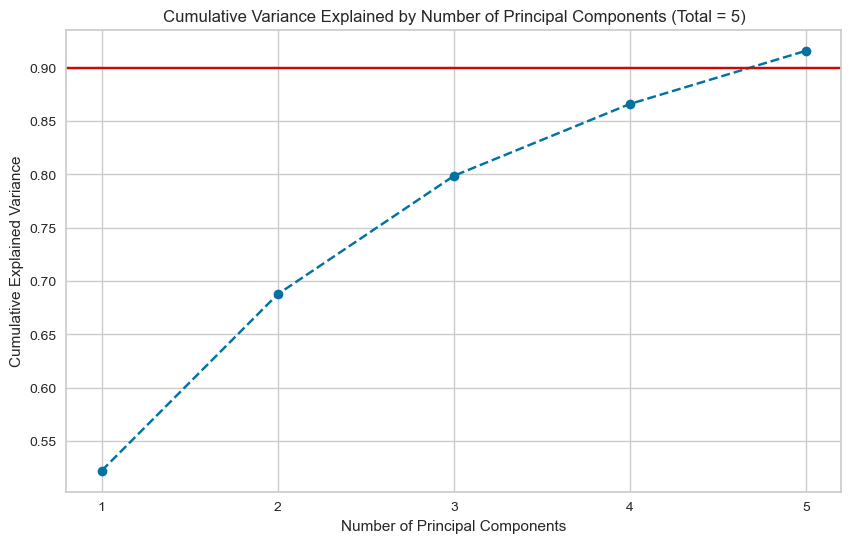

In [86]:
explained_variance_ratio_90 = pca_90.explained_variance_ratio_
cumulative_explained_variance_90 = explained_variance_ratio_90.cumsum()

# Adding a horizontal line to highlight the threshold of 90%
plt.figure(figsize = (10, 6))
plt.plot(range(1, len(cumulative_explained_variance_90) + 1), cumulative_explained_variance_90, marker = 'o',
         linestyle = '--', color = 'b')
plt.axhline(y = 0.90, color = 'r', linestyle = '-')
plt.title('Cumulative Variance Explained by Number of Principal Components (Total = 5)')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.xticks(range(1, len(cumulative_explained_variance_90) + 1))
plt.grid(True)
plt.show()

In [87]:
overall_variance_explained_90 = np.sum(explained_variance_ratio_90)
print(f"Overall Variance Explained by minimum number of PCA components : {overall_variance_explained_90:.4f}")

Overall Variance Explained by minimum number of PCA components : 0.9161


### ***SOLUTION (3 G.)***

In [88]:
# Initializing the SVM classifier
svm_pca_90 = SVC(random_state = 42)
svm_pca_90

SVC(random_state=42)

In [89]:
# Training SVM on the PCA-transformed training data
svm_pca_90.fit(train_components_90_df, y_train)

SVC(random_state=42)

In [90]:
# Predicting the train and test set

y_test_pca_90_pred = svm_pca_90.predict(test_components_90)
y_train_pca_90_pred = svm_pca_90.predict(train_components_90)

print("Train Set Accuracy:", format(accuracy_score(y_train, y_train_pca_90_pred), '.5f'))
print("Test Set Accuracy:", format(accuracy_score(y_test, y_test_pca_90_pred), '.5f'))

Train Set Accuracy: 0.81509
Test Set Accuracy: 0.72941


### ***SOLUTION (3 H.)***

Training Set:
    Accuracy: 0.815
    Recall: 0.788
    Precision: 0.806
    F1 Score: 0.794
Testing Set:
    Accuracy: 0.729
    Recall: 0.708
    Precision: 0.715
    F1 Score: 0.708

Classification Report for Training Set:
              precision    recall  f1-score   support

           0       0.87      0.71      0.78       166
           1       0.85      0.89      0.87       351
           2       0.70      0.77      0.73       159

    accuracy                           0.82       676
   macro avg       0.81      0.79      0.79       676
weighted avg       0.82      0.82      0.81       676


Classification Report for Testing Set:
              precision    recall  f1-score   support

           0       0.79      0.65      0.72        52
           1       0.79      0.82      0.81        78
           2       0.57      0.65      0.60        40

    accuracy                           0.73       170
   macro avg       0.72      0.71      0.71       170
weighted avg       0.74    

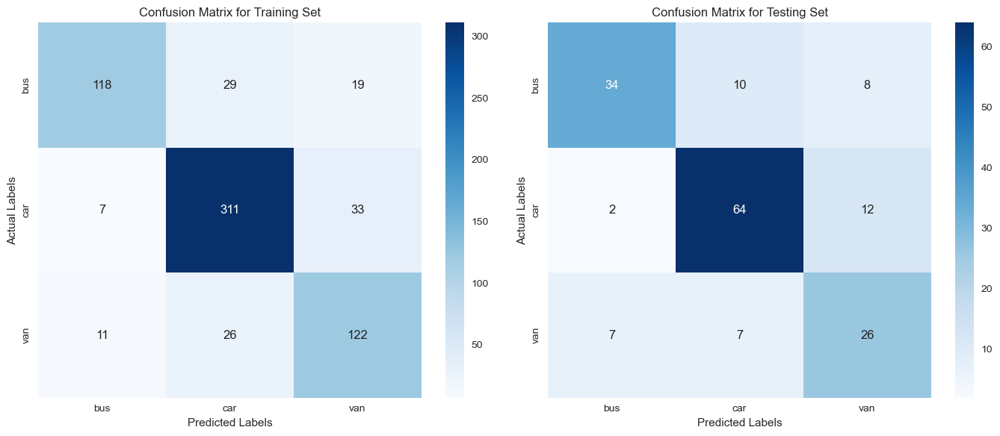

Confusion Matrix for Final Training Set:
 [[118  29  19]
 [  7 311  33]
 [ 11  26 122]]
Confusion Matrix for Final Testing Set:
 [[34 10  8]
 [ 2 64 12]
 [ 7  7 26]]


In [91]:
# Evaulating the performance of the model on train and test set

conf_matrix_train = confusion_matrix(y_train, y_train_pca_90_pred)
conf_matrix_test = confusion_matrix(y_test, y_test_pca_90_pred)

evaluation_metrics(y_train, y_train_pca_90_pred, y_test, y_test_pca_90_pred, conf_matrix_train, conf_matrix_test)

From above, we san see that:
 * The model achieves an accuracy of 81.5% on the training set, while a slightly lower accuracy of 72.9% on the testing set
 * Overall precision is also ~10% lesser in testing set when compared to training set
 * Recall for training set is 8% more than the testing set
 * F1-Score, however, indicates a good balance between the recall and precision in model's prediction
 * Comparing this metrics with the one acheived from SVM model trained on original PCA, we see that the original one performed better with the training and testing data accuracy, recall, precision and f1-score close to each other
 * Overall, the model performs slightly better on training set than the test set, which can indicate some level of overfitting. We might need to do hyperparameter tuning for the model to reduce the overfitting

In [92]:
# Adding values in comparison table table for final comparison of performance
temp_dataframe = pd.DataFrame({'Model': ['SVM Model (PCA with 5 components)'],
                                 'Accuracy(Training Set)': format(accuracy_score(y_train, y_train_pca_90_pred), '.4f'), 
                                 'Accuracy(Testing Set)': format(accuracy_score(y_test, y_test_pca_90_pred), '.4f')})

final_comparison = pd.concat([final_comparison, temp_dataframe])
final_comparison

,Model,Accuracy(Training Set),Accuracy(Testing Set)
0,Base Classification SVM Model,0.9778,0.9647
0,SVM Model (PCA with 5 components),0.8151,0.7294


## QUESTION 4
<br>

### ***SOLUTION (4 A.)***

>Now, since we need to train our SVM on the componenets we got out of the 90% threshold PCA, let's start with the 'X_scaled_pca_90' dataset.
>
>To revise, we got X_scaled_pca_90 after we applied PCA for Minimum Components with 90% or above variance (we got this as 5) explained on out scaled X set (X_scaled)

In [93]:
# printing the X_scaled_pca_90 dataframe
X_scaled_pca_90_df.head()

,PC_90_1,PC_90_2,PC_90_3,PC_90_4,PC_90_5
0,0.332879,-0.218140,1.001637,0.179057,0.076843
1,-1.592694,-0.421925,-0.368609,0.232003,0.694728
2,3.766520,0.194842,0.088327,1.201539,0.735230
3,-1.739121,-2.830152,0.109963,0.377442,-0.362594
4,0.554789,4.758143,11.702781,0.127962,3.258638


In [94]:
# Let's perform train-test split on this PCA-transformed data
X_scaled_pca_90_train, X_scaled_pca_90_test, y_train, y_test = train_test_split(X_scaled_pca_90,
                                                                                y, test_size = 0.2, random_state = 42)

In [95]:
# Shapes of the resulting datasets
print("X_scaled_pca_90_test shape:", X_scaled_pca_90_train.shape)
print("X_scaled_pca_90_test shape:", X_scaled_pca_90_test.shape)
print("Y_train shape:", y_train.shape[0])
print("Y_test shape:", y_test.shape[0])

X_scaled_pca_90_test shape: (676, 5)
X_scaled_pca_90_test shape: (170, 5)
Y_train shape: 676
Y_test shape: 170


> **Why we need to split out train and test sets for our data again?**
> * If we apply PCA to the whole dataset before dividing it into training and testing parts, information from the testing part can unintentionally influence how PCA works on the training part
> * This might make the model seem better at predicting new data than it actually is, leading to overfitting
> * To get a more accurate assessment, it's better to split the data first. That way, PCA only learns from the training data, which keeps the evaluation fair and realistic

In [96]:
# Now, let's initialize our new SVM model
svm_tuned = SVC(random_state = 42)
svm_tuned

SVC(random_state=42)

In [97]:
# Defining parameter grid for GridSearchCV
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf']#, 'poly'],
    #'degree': [2, 3, 4]
}

# Initializing GridSearchCV
grid_search = GridSearchCV(estimator = svm_tuned, param_grid = param_grid,
                           cv = 5, scoring = 'accuracy', verbose = 1, n_jobs = -1)

grid_search

GridSearchCV(cv=5, estimator=SVC(random_state=42), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [0.1, 1, 10, 100],
                         'kernel': ['linear', 'rbf']},
             scoring='accuracy', verbose=1)

In [98]:
# Performing Grid Search to find best parameters

start_time_fit = time.time();
fit_grid_search = grid_search.fit(X_scaled_pca_90_train, y_train)
end_time_fit = time.time();

print("SVM Grid Search Tuning on PCA-transformed data Time:", 
      format((end_time_fit - start_time_fit), '.2f'), "seconds")

print("\n Fitted Model - \n")
fit_grid_search
fit_grid_search

Fitting 5 folds for each of 32 candidates, totalling 160 fits
SVM Grid Search Tuning on PCA-transformed data Time: 4.37 seconds

 Fitted Model - 



GridSearchCV(cv=5, estimator=SVC(random_state=42), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [0.1, 1, 10, 100],
                         'kernel': ['linear', 'rbf']},
             scoring='accuracy', verbose=1)

### ***SOLUTION (4 B.)***

In [99]:
# Getting the best parameters found by Grid Search
best_parameters = grid_search.best_params_
print("Best Parameters found by Grid Search on PCA-transformed data - \n       ", best_parameters)

Best Parameters found by Grid Search on PCA-transformed data - 
        {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


>Conclusing on the best parameters to tune our model, we see below to be used:
>- 'C' = 10
>- 'gamma' = '0.1'
>- 'kernel' = 'rbf'
>
>We will be using these parameters to have further predictions

### ***SOLUTION (4 C.)***

In [100]:
best_model = grid_search.best_estimator_
best_model.fit(X_scaled_pca_90_train, y_train)

SVC(C=10, gamma=0.1, random_state=42)

In [101]:
y_train_pred_tuned = best_model.predict(X_scaled_pca_90_train)
y_test_pred_tuned = best_model.predict(X_scaled_pca_90_test)

print("Train Set Accuracy:", format(accuracy_score(y_train, y_train_pred_tuned), '.5f'))
print("Test Set Accuracy:", format(accuracy_score(y_test, y_test_pred_tuned), '.5f'))

Train Set Accuracy: 0.89497
Test Set Accuracy: 0.81765


Training Set:
    Accuracy: 0.895
    Recall: 0.880
    Precision: 0.884
    F1 Score: 0.882
Testing Set:
    Accuracy: 0.818
    Recall: 0.791
    Precision: 0.811
    F1 Score: 0.799

Classification Report for Training Set:
              precision    recall  f1-score   support

           0       0.89      0.86      0.88       166
           1       0.92      0.93      0.93       351
           2       0.84      0.84      0.84       159

    accuracy                           0.89       676
   macro avg       0.88      0.88      0.88       676
weighted avg       0.89      0.89      0.89       676


Classification Report for Testing Set:
              precision    recall  f1-score   support

           0       0.84      0.79      0.81        52
           1       0.83      0.91      0.87        78
           2       0.77      0.68      0.72        40

    accuracy                           0.82       170
   macro avg       0.81      0.79      0.80       170
weighted avg       0.82    

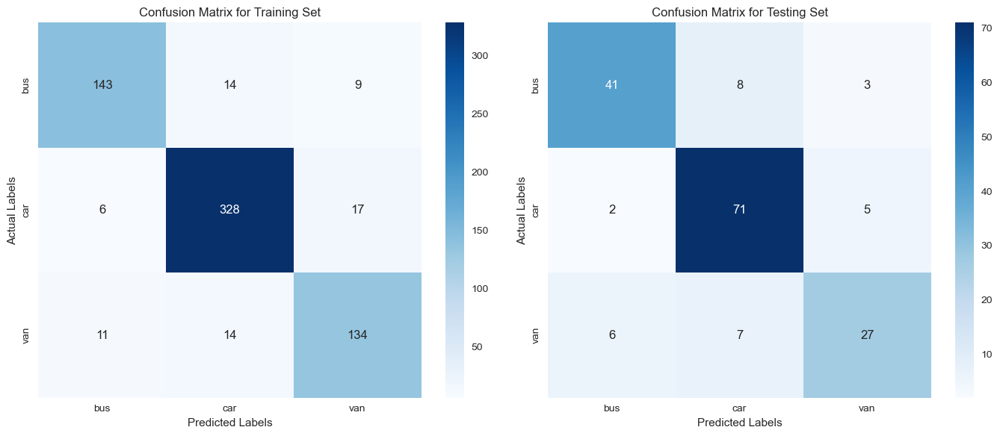

Confusion Matrix for Final Training Set:
 [[143  14   9]
 [  6 328  17]
 [ 11  14 134]]
Confusion Matrix for Final Testing Set:
 [[41  8  3]
 [ 2 71  5]
 [ 6  7 27]]


In [102]:
# Evaulating the performance of the model on train and test set

conf_matrix_train = confusion_matrix(y_train, y_train_pred_tuned)
conf_matrix_test = confusion_matrix(y_test, y_test_pred_tuned)

evaluation_metrics(y_train, y_train_pred_tuned, y_test, y_test_pred_tuned, conf_matrix_train, conf_matrix_test)

From above confusion matrix and evaluation parameters, we can see below points:
1. **Accuracy:**
    * Accuracy acheived on training set(89.5%) is slightly higher than that of testing set (81.8%).
    * This shows that along with performing well and correctly predicting 89.5% of labels, it also performs well on unseen data
    <br><br>
2. **Precision and Recall:**
    * Precision and recall values are slightly lower on the testing set when compared to the training set but remain relatively high across all classes (0, 1, 2 - 'bus', 'car', 'van')
    * Precision values range from 84% to 92% on training set and recall, also strong, range from 84% to 93% 
    <br><br>
3. **F1-Score:**
    * The F1 score for training set is higher than that of tsting set however, both indicate a good balance between precision and recall
    <br><br>
4. **Confusion Matrix:**
    * It shows that while most predictions are accurate on the training set, there are some misclassifications, particularly in distinguishing between classes 'bus' and 'car' (class 0 and class 1)
    * Similar to the training set, testing set also shows patterns of misclassifications in accurately predicting classes 0 and 2 ("bus' and 'van')
    <br><br>
5. **Overall Insights:**
    * SVM model trained on PCA-transformed data shows strong performance metrics across accuracy, precision, recall, and F1 scores, indicating effective learning and generalization capabilities in our dataset
    * Despite strong performance, further tuning might be helpful in potentially improving accuracy, especially in distinguishing between classes that are more challenging to differentiate

In [103]:
# Adding values in comparison table table for final comparison of performance
temp_dataframe = pd.DataFrame({'Model': ['SVM Model Tuned (PCA-transformed)'],
                                 'Accuracy(Training Set)': format(accuracy_score(y_train, y_train_pred_tuned), '.4f'), 
                                 'Accuracy(Testing Set)': format(accuracy_score(y_test, y_test_pred_tuned), '.4f')})

final_comparison = pd.concat([final_comparison, temp_dataframe])

In [104]:
final_comparison

,Model,Accuracy(Training Set),Accuracy(Testing Set)
0,Base Classification SVM Model,0.9778,0.9647
0,SVM Model (PCA with 5 components),0.8151,0.7294
0,SVM Model Tuned (PCA-transformed),0.8950,0.8176


Based on the above accuracy table, we can conclude below points:

 1. **Base Classification SVM Model**
     * It got a high accuracy of 97.78%, indicating that the model fits the training data very well.along with maintaining a high accuracy of 96.47% on testing set, suggesting strong generalization to unseen data
     * This model shows excellent performance on both training and testing sets, indicating that it effectively learns and predicts the classes in the dataset without overfitting
     <br><br>
 2. **SVM Model (PCA with 5 components):**
    * While it achieved an accuracy of 81.51%, it is lower compared to the base SVM model. The performance decreased to to 72.94% on the testing set as well
    * The use of PCA with only 5 components reduces the dimensionality of the data but also reduces the amount of explained variance, impacting the model's ability to capture the dataset's variability
    * Lower accuracy on both training and testing sets suggests that the reduced feature space may not provide enough information for the SVM to generalize well
    <br><br>
 3. **SVM Model Tuned (PCA-transformed):**
     * There is an improvement in accuracy (89.50%) over the previous model on the training set along with improving performance on the testing set to 81.76%, indicating better generalization compared to the PCA with 5 components
     * We see that tuning the SVM model on PCA-transformed data has improved accuracy compared to the basic PCA approach
     * The higher accuracy on both training and testing sets suggests that the model is better leveraging the reduced but informative features obtained from PCA, combined with optimized hyperparameters
     * However, there is still a slight gap between training and testing accuracies, indicating some level of overfitting after tuning. It might be possible that the model bias towards the training data
     <br><br>
     
**Overall Comparison**
 * The base SVM model without PCA achieves the highest accuracies on both training and testing sets, indicating superior performance in our case
 * While PCA-based models reduce dimensionality, they also compromise on accuracy to varying degrees. Tuning the SVM on PCA-transformed data helps mitigate some of these drawbacks but may still not match the performance of the base SVM model
<br><br>

The **Overall Variance Explained by 10 PCA components is 0.9880** which is much higher than the **Overall Variance when Explained by minimum number (5) of PCA components which stands at 0.9161** 
<br> While the former scenario demonstrates that using more components can capture nearly all the data's variability, resulting in better performance at the expense of higher dimensionality, the latter scenario balances dimensionality reduction and information retention. This balance makes it suitable for scenarios where computational efficiency is critical, although it may sacrifice some accuracy

In conclusion, selecting between these models involves balancing accuracy with computational efficiency, particularly for PCA-based models. The base SVM model excels in accuracy, whereas PCA-based models provide the advantage of dimensionality reduction but it might require further careful tuning to achieve optimal performance

***
### *** HIGHLIGHT ON OUTLIER DETECTION AND IT'S EFFECT ON OVERALL PERFORMANCE ***

<br>Below is the table for preformance values when outlier detection was performed and outliers were replaced by medians of respective columns grouped by classes

<br>

**Performance After Outlier Detection and Imputation**

| Model                               | Accuracy (Training Set) | Accuracy (Testing Set) |
|-------------------------------------|-------------------------|------------------------|
| Base Classification SVM Model        | 0.9867                  | 0.9765                 |
| SVM Model (PCA with 5 components)    | 0.9127                  | 0.8941                 |
| SVM Model Tuned (PCA-transformed)    | 0.9527                  | 0.9059                 |


We see here that thought the overall performance for all the 3 models was improved, it was also observed that after handling outliers also, the Base Classification SVM model performed best overall with both training and testing set having alsmot similar accuracies.
<br> The other two models, especially the tunes SVM model on PCA transformed data, appear to be overfitted when compared to the Base SVM model.

<br>

The **Overall Variance Explained by 10 PCA components is 0.9888** which is much higher than the **Overall Variance when Explained by minimum number (5) of PCA components which stands at 0.9139**  in this case also 


***According to me, this outlier detection and imputation approach is not required for this instance of our dataframe as these might be the actual values showing indifferences with overall data and show overall performance of different vehicles with respect to the other ones***

## QUESTION 5
<br>

### ***SOLUTION (5 A.)***

Principal Component Analysis (PCA) is a powerful technique for dimensionality reduction and feature extraction in data analysis. 
<br>

**Prerequisites/Assumptions of PCA**
* **Numerical Data:**
    <br> &emsp; PCA requires numerical data since it relies on the calculation of means, variances, and covariances
    <br>
    
 * **Scaling of Variables:**
    <br> &emsp; If the variables have different units or scales, standardization (scaling to unit variance) is often performed before applying PCA. This ensures that all variables contribute equally to the analysis
    <br>
    
 * **Sensitivity to Outliers:**
    <br> &emsp; PCA is sensitive to outliers, as they can disproportionately influence the calculation of means and covariances. Therefore, it is advisable to identify and handle outliers, in in larger quantity,  before applying PCA
    <br>
    
 * **Linearity:**
    <br> &emsp; PCA assumes that the relationships between the variables are linear. This means that PCA is most effective when the data can be approximated well by a linear combination of features.
    <br>
    
* **Large Sample Size:**
    * For PCA to be effective, a sufficiently large sample size is important
    * This ensures that the covariance matrix is stable and the principal components derived are reliable
    <br><br>
    
* **Independence of Principal Components:**
    <br> &emsp; The principal components are uncorrelated to each other. This is a fundamental property of PCA
    <br>
    
* **Variance as an Indicator of Importance:**
    <br> &emsp; PCA assumes that components with higher variance are more important. The method seeks to maximize the variance captured by the principal components
    <br>
    
* **Multicollinearity:**
    <br> &emsp; PCA is particularly useful when there is multicollinearity in the data, as it transforms the original correlated variables into a set of uncorrelated principal components
    <br>
    


### ***SOLUTION (5 B.)***

**Advantages of PCA**
* **Dimensionality Reduction:**
    <br> &emsp; PCA reduces the number of dimensions (variables) in a dataset while retaining the most important information. This simplifies the dataset and can help in visualizing high-dimensional data
    <br>
    
 * **Uncorrelated Features:**
    <br> &emsp; The principal components are orthogonal (uncorrelated) to each other. This property can be useful in situations where multicollinearity is an issue, such as in regression analysis
    <br>
    
 * **Noise Reduction:**
    <br> &emsp; By focusing on the principal components that capture the most variance, PCA can help in reducing noise and irrelevant information, so the small variations in the background are ignored automatically
    <br>
    
 * **Data Compression:**
    <br> &emsp;PCA can be used for data compression by reducing the dimensionality of the dataset while retaining most of the original information. This can save storage space and computational resources.
    <br>
    
 * **Visualization:**
    <br> &emsp; PCA can transform high-dimensional data into a lower-dimensional space (usually 2D or 3D), making it easier to visualize and understand patterns and relationships in the data.
    <br>
    
 * **Feature Extraction:**
     <br> &emsp; PCA helps in identifying the most important features that contribute to the variance in the data. These new features (principal components) can be used for further analysis and modeling.
 
 ***
 
**Disadvantages/Limitations of PCA**
* **Linearity Assumption:**
    <br> &emsp; PCA assumes linear relationships among variables. It may not capture complex, non-linear relationships in the data, which can limit its effectiveness in some applications
    <br>
    
* **Interpretability:**
    <br> &emsp; The principal components are linear combinations of the original variables and may not have a clear or intuitive interpretation, making it difficult to understand the transformed features.
    <br>
    
* **Variance-Based Focus:**
    <br> &emsp; PCA focuses on capturing the maximum variance in the data. However, high variance does not always correspond to the most important or meaningful features, especially in cases where the underlying structure is not driven by variance
    <br>
        
* **Sensitivity to Scaling:**
    <br> &emsp; PCA is sensitive to the scaling of variables. If the variables have different units or scales, they need to be standardized before applying PCA; otherwise, the results may be biased towards variables with larger scales
    <br>


***
***
**END OF PROJECT**
***
***